# 2024-03-28 30v3 - Implementing gridsearch and analyzing its impact-- REBUTTALS.ipynb
Clone of `2024-01-30 30 - Implementing gridsearch and analyzing its impact.ipynb`. This is the main notebook for the generation of new plots and tables for the rebuttal requests. 

The plan is to include: 
- New models (iTransformer, Pyraformer, etc)
- New datasets (ETTh,ETTm, illness, traffic)
- Some cleanup specific to the new datasets and models.
- New plots and tables to satisfy reviewers requests
- Cleanups and refactors to common data processing and plot functions.

## Parameters

In [1]:
# Needed to filter on the gridsearch
CONSTRAINT_TYPE='constant'
#CONSTRAINT_TYPE='monotonic'

Folder name

In [2]:
import datetime
import os 

today = datetime.date.today()
formatted_date = today.strftime("%Y-%m-%d")

# Figures will be stored here.
#FIGURES_FOLDER = f"../figures/icml_monotonic_{formatted_date}"
FIGURES_FOLDER = f"../figures/icml_post_rebuttal"


os.makedirs(FIGURES_FOLDER, exist_ok=True)
FIGURES_FOLDER

'../figures/icml_post_rebuttal'

## Libraries and setup

In [3]:
%load_ext autoreload
%autoreload 2

In [4]:
import sys
import os
sys.path.append(os.path.abspath(os.path.join(os.getcwd(), os.pardir)))

In [5]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import matplotlib as mpl
import seaborn as sns
from IPython.display import display, Markdown, Latex

In [6]:
from utils import wandb_utils

## Data loading
From the cached pkl files. If they break, use the CSV ones.

### Resilience data
The original resilience runs from the paper are in this dataset. Rebuttal runs did not have resilience as of march 28 morning.
### Non resilience data
Original experiment data including non-resilience constant-$\epsilon$ runs

In [7]:
CONSTRAINT_TYPE='constant' 
# To clean up some messes.
og_models=["Autoformer","Informer","Reformer","Transformer"]

# Resilience runs will be merged later to the df.
real_df_resilience = pd.read_pickle("../data_backups/2024_02_01_1038am__icml_backup_data.pkl")
real_df_resilience = real_df_resilience.query('constraint_type=="constant_resilience" or constraint_type=="erm"')

# Real data is the original set of runs
#real_df = pd.read_pickle("../data_backups/2024_02_01_1038am__icml_backup_data.pkl")
real_df = pd.read_pickle("../data_backups/2024_03_29__original_experiments.pkl") # New dataset with updated loader
#real_df = real_df.query('constraint_type=="constant" or constraint_type=="erm"')
real_df = real_df.query('constraint_type==@CONSTRAINT_TYPE or (constraint_type=="erm" and seed==2021)') # Avoid duplicate ERMs.


# These two are the rebuttal runs
#real_df_newdatasets = pd.read_pickle("../data_backups/2024_03_28__newdatasets_erm_and_constrained.pkl")
real_df_newdatasets = pd.read_pickle("../data_backups/2024_04_17__newdatasets_erm_and_constrained_w_val.pkl") #newer version with both train and val constraints.
# Filter unused models or wrongly tagged, and duplicate Pyraformer ERM runs.
real_df_newmodels = pd.read_pickle("../data_backups/2024_03_28__newmodels_erm_and_constrained.pkl") \
        .query('model!="TimesNet"') \
        .query('model!="Transformer"') \
        .query('model!="Reformer"') \
        .query('model not in @og_models') \
        .copy()
real_df_newmodels_newdatasets = pd.read_pickle("../data_backups/2024_04_17__newdatasets_newmodels_erm_and_constrained.pkl")


# Add all except resilience for now
df = pd.concat([real_df,real_df_newmodels,real_df_newdatasets,real_df_newmodels_newdatasets], ignore_index=True,axis=0)
df = df.query("run_id not in ['8ebn797a', 'f3h5d2k9', 'l4zii0ej', 'nusqty14', 'v2aqitjd','2u2orrgj', 'bbedl2fm', 'lqqgbl0c']").copy()

display(real_df_resilience[['constraint_type','resilient_lr']].drop_duplicates())
display(df.head())

,constraint_type,resilient_lr
169344,constant_resilience,0.1
764640,erm,NaN


,des,gpu,itr,d_ff,data,freq,loss,seed,c_out,embed,...,seg_len,multistep,task_name,hidden_dim,num_blocks,dynamic_dim,num_kernels,hidden_layers,p_hidden_dims,p_hidden_layers
0,Constrained loose weather.csv Informer 336 seed1.,0,1,2048,custom,h,mse,6163,21,timeF,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Constrained loose weather.csv Informer 336 seed1.,0,1,2048,custom,h,mse,6163,21,timeF,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Constrained loose weather.csv Informer 336 seed1.,0,1,2048,custom,h,mse,6163,21,timeF,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Constrained loose weather.csv Informer 336 seed1.,0,1,2048,custom,h,mse,6163,21,timeF,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Constrained loose weather.csv Informer 336 seed1.,0,1,2048,custom,h,mse,6163,21,timeF,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
print(f"Total number of runs: {df.run_id.nunique()}")
print(f"Total number of models: {df.model.nunique()}")
print(f"Total number of datasets: {df.data_path.nunique()}")

Total number of runs: 1667
Total number of models: 8
Total number of datasets: 9


In [9]:
df.query('model=="Pyraformer"').data_path.unique()

array(['traffic.csv', 'electricity.csv', 'exchange_rate.csv',
       'weather.csv', 'national_illness.csv', 'ETTm2.csv', 'ETTm1.csv',
       'ETTh2.csv', 'ETTh1.csv'], dtype=object)

### ALTERNATIVE DATALOADING: MONOTONIC + RESILIENCE
For some ad hoc plots required by the rebuttal.

In [10]:
# #CONSTRAINT_TYPE='constant' #TODO see if we will need this.


# # Real data is the original set of runs
# #real_df = pd.read_pickle("../data_backups/2024_02_01_1038am__icml_backup_data.pkl")
# real_df = pd.read_pickle("../data_backups/2024_03_29__original_monotonic_plus_erm.pkl") # New dataset with updated loader

# real_df_resilience = real_df.query("constraint_type=='monotonic_resilience' or constraint_type=='erm'")
# real_df_resilience = real_df_resilience.query('constraint_type=="monotonic_resilience" or constraint_type=="erm"')

# real_df = real_df.query('constraint_type=="monotonic" or constraint_type=="erm"')
# df = real_df

# display(real_df_resilience[['constraint_type','resilient_lr']].drop_duplicates())
# display(df[['constraint_type','resilient_lr']].drop_duplicates())
# display(df.head())

In [11]:
df.constraint_type.unique()

array(['constant', 'erm'], dtype=object)

In [12]:
real_df_newmodels.groupby(['model','constraint_type'])['run_id'].nunique().reset_index()

,model,constraint_type,run_id
0,FiLM,constant,24
1,FiLM,erm,16
2,Nonstationary_Transformer,constant,57
3,Nonstationary_Transformer,erm,16
4,Pyraformer,constant,57
5,Pyraformer,erm,23
6,iTransformer,constant,34
7,iTransformer,erm,12


### (newmodels) Debug

In [13]:
display(real_df_newdatasets.constraint_type.unique())
real_df_newdatasets.groupby(['data_path','model','pred_len','seed','constraint_type'])['run_id'].nunique().reset_index().sort_values('run_id',ascending=True)

array(['constant', 'erm'], dtype=object)

,data_path,model,pred_len,seed,constraint_type,run_id
107,ETTm2.csv,Informer,192,2021,erm,1
123,ETTm2.csv,Transformer,192,2021,erm,1
125,ETTm2.csv,Transformer,336,2021,erm,1
127,ETTm2.csv,Transformer,720,2021,erm,1
128,electricity.csv,Pyraformer,96,1711151578,erm,1
...,...,...,...,...,...,...
50,ETTh2.csv,Reformer,192,2021,constant,6
52,ETTh2.csv,Reformer,336,2021,constant,6
56,ETTh2.csv,Transformer,96,2021,constant,6
146,national_illness.csv,Autoformer,36,2021,constant,6


In [14]:
display(real_df_newmodels.constraint_type.unique())
real_df_newmodels.groupby(['data_path','model','pred_len','seed'])['run_id'].nunique().reset_index().sort_values('run_id',ascending=True)

array(['constant', 'erm'], dtype=object)

,data_path,model,pred_len,seed,run_id
59,exchange_rate.csv,Pyraformer,336,1711161452,1
75,traffic.csv,Nonstationary_Transformer,720,1711192203,1
73,traffic.csv,Nonstationary_Transformer,336,1711188502,1
71,traffic.csv,Nonstationary_Transformer,192,1711186078,1
69,traffic.csv,Nonstationary_Transformer,96,1711184315,1
...,...,...,...,...,...
10,electricity.csv,Nonstationary_Transformer,192,2021,6
12,electricity.csv,Nonstationary_Transformer,336,2021,6
105,weather.csv,Pyraformer,192,2021,6
107,weather.csv,Pyraformer,336,2021,6


In [15]:
df.groupby(['data_path','model','pred_len','seed'])['run_id'].nunique().reset_index().sort_values('run_id',ascending=True)

,data_path,model,pred_len,seed,run_id
325,weather.csv,iTransformer,720,1711477957,1
135,electricity.csv,Nonstationary_Transformer,720,1711166469,1
268,traffic.csv,iTransformer,336,1711473689,1
270,traffic.csv,iTransformer,720,1711475106,1
137,electricity.csv,Pyraformer,96,1711151578,1
...,...,...,...,...,...
96,ETTm2.csv,Pyraformer,96,2021,7
97,ETTm2.csv,Pyraformer,192,2021,7
98,ETTm2.csv,Pyraformer,336,2021,7
66,ETTm1.csv,Nonstationary_Transformer,336,2021,7


### Summary of runs per dataset

In [16]:
# If there are not seven runs per set (6 constrained and one erm) means probably missing runs.
# As of march 28 there are some missing runs but we'll leave it like that for now.
runs_per_groupset=df.groupby(['data_path','model','pred_len','seed'])['run_id'].nunique().reset_index()
runs_per_groupset[runs_per_groupset.run_id!=7]

,data_path,model,pred_len,seed,run_id
19,ETTh1.csv,Reformer,720,2021,5
47,ETTh2.csv,Reformer,720,2021,6
75,ETTm1.csv,Reformer,720,2021,6
87,ETTm2.csv,Autoformer,720,2021,5
103,ETTm2.csv,Reformer,720,2021,6
...,...,...,...,...,...
321,weather.csv,iTransformer,192,1711477522,1
322,weather.csv,iTransformer,336,2021,3
323,weather.csv,iTransformer,336,1711477724,1
324,weather.csv,iTransformer,720,2021,3


## Data processing
This section contains processing specific to this experiment set. If you clone this notebook. Remove or refactor this section.

In [17]:
# TODO preprocessing here.

### Gridsearch function (todo extract into script)
Meant to be used on `df_constrained` (containing only constant constrained `df`)

In [18]:
def gridsearch(runs_df, objective_col, gridsearch_keys, reference_cols, split='val',mode='mean'):
    """
    Performs a gridsearch across the runs under `gridsearch_keys`, with the objective of minimizing `objective_col`.
    
    Parameters
    ---
    mode: is either 'mean' or 'std', to choose which statistic of the objective value to use for the gridsearch.
    
    Returns 
    ---
    
        the runs_df filtered by the best runs, and the summary metric of the best runs.
    """
    grouped_cols = gridsearch_keys + reference_cols + ['constraint_level'] #todo maybe don't need to hardcode this
    summary_metric = objective_col

    run_gridsearch_stats = runs_df.query(f"split=='{split}'").groupby(grouped_cols).agg(
        mean_objective=(objective_col, 'mean'),
        std_objective=(objective_col, 'std'),
        #mean_constraint_violation=('constraint_violation', 'mean'), #is it worth having other stuff here?
        count=('step', 'size')
    ).reset_index().sort_values(['model', 'std_objective'])

    best_runs = run_gridsearch_stats.groupby(gridsearch_keys)[f'{mode}_objective'].idxmin()
    best_runs_df = run_gridsearch_stats.loc[best_runs, :]
    filtered_runs_df = runs_df[runs_df['run_id'].isin(best_runs_df['run_id'].unique())] #TODO run_id is a hard requirement in the group cols.

    return filtered_runs_df, best_runs_df[grouped_cols + [f'{mode}_objective']]

### Label constraint_levels (`constraint_idx` column)
useful for joining when the constraint values are different for each model.

In [19]:
# There are three constraint levels per run, add a rank column, sorted by constraint level.
df=df.copy()#df_constrained.copy()
if 'monotonic' not in CONSTRAINT_TYPE:
    #display(df[['seed','data_path','model','pred_len','constraint_level']].drop_duplicates().sort_values(['data_path','model','pred_len','constraint_level']).head())
    df.loc[df.constraint_type==CONSTRAINT_TYPE,'constraint_idx'] = df.query('constraint_type==@CONSTRAINT_TYPE').groupby(['seed','data_path','model','pred_len'])['constraint_level'].rank(method='dense', ascending=True).astype(int)
    df.loc[df.constraint_type=='erm','constraint_idx'] = 0
    df['constraint_idx'] = df['constraint_idx'].astype(int)
    # ranked_constraint_levels_summary = df[['run_id','data_path','model','pred_len','constraint_type','constraint_level','constraint_idx']].drop_duplicates('run_id').sort_values(['data_path','model','pred_len','constraint_level'])
    # print("Sanity checking on the summary")
    # display(ranked_constraint_levels_summary)
    
    # There are three constraint levels per run, add a rank column, sorted by constraint level.
    #The constraint idx column in resilience is used for reference in some of the table and plots
    real_df_resilience=real_df_resilience.copy()#df_constrained.copy()
    #display(df[['seed','data_path','model','pred_len','constraint_level']].drop_duplicates().sort_values(['data_path','model','pred_len','constraint_level']).head())
    real_df_resilience.loc[real_df_resilience.constraint_type==f'{CONSTRAINT_TYPE}_resilience','constraint_idx'] = real_df_resilience.query(f'constraint_type=="{CONSTRAINT_TYPE}_resilience"').groupby(['seed','data_path','model','pred_len'])['constraint_level'].rank(method='dense', ascending=True).astype(int)
    real_df_resilience.loc[real_df_resilience.constraint_type=='erm','constraint_idx'] = 0
    real_df_resilience['constraint_idx'] = real_df_resilience['constraint_idx'].astype(int)
    # ranked_constraint_levels_summary = real_df_resilience[['run_id','data_path','model','pred_len','constraint_type','constraint_level','constraint_idx']].drop_duplicates('run_id').sort_values(['data_path','model','pred_len','constraint_level'])
    # print("Sanity checking on the summary")
    # display(ranked_constraint_levels_summary)
else:
    print(f"{CONSTRAINT_TYPE} doesn't have a constraint level, Adding placeholder.")
    df.loc[df.constraint_type==CONSTRAINT_TYPE,'constraint_idx'] = 1
    df.loc[df.constraint_type=='erm','constraint_idx'] = 0
    real_df_resilience.loc[real_df_resilience.constraint_type==f'{CONSTRAINT_TYPE}_resilience','constraint_idx'] = 1
    real_df_resilience.loc[real_df_resilience.constraint_type=='erm','constraint_idx'] = 0
    real_df_resilience['constraint_idx'] = real_df_resilience['constraint_idx'].astype(int)
    # Constraint level must be set or else things break
    df['constraint_level'] = 0
    real_df_resilience['constraint_level'] = 0

### Create `is_monotonic`
A useful thing to have to compare infeasible_rate pct diff in monotonic

In [20]:
#df_to_plot.query('constraint_type=="erm"')
df=df.sort_values(['run_id','step'])
df['lag_1_mse'] = df.groupby('run_id')['mse'].shift(1)
df['mse_diff'] = df['lag_1_mse'] - df['mse'] #if positive, prev>current, not monotonic
df['is_monotonic'] = df['mse_diff'] < 0
#Sanity check:
display(df.loc[:,['run_id','step','lag_1_mse','mse','mse_diff','is_monotonic']])

real_df_resilience=real_df_resilience.sort_values(['run_id','step'])
real_df_resilience['lag_1_mse'] = real_df_resilience.groupby('run_id')['mse'].shift(1)
real_df_resilience['mse_diff'] = real_df_resilience['lag_1_mse'] - real_df_resilience['mse'] #if positive, prev>current, not monotonic
real_df_resilience['is_monotonic'] = real_df_resilience['mse_diff'] < 0
#Sanity check:
real_df_resilience.loc[:,['run_id','step','lag_1_mse','mse','mse_diff','is_monotonic']]

,run_id,step,lag_1_mse,mse,mse_diff,is_monotonic
38304,02zvd69l,0,NaN,0.114758,NaN,False
38496,02zvd69l,0,0.114758,1.098359,-0.983601,True
38688,02zvd69l,0,1.098359,1.038375,0.059985,False
38305,02zvd69l,1,1.038375,0.086876,0.951498,False
38497,02zvd69l,1,0.086876,0.444963,-0.358087,True
...,...,...,...,...,...,...
1163662,zz22ssmi,718,0.767370,1.253086,-0.485716,True
1164382,zz22ssmi,718,1.253086,0.694911,0.558175,False
1162943,zz22ssmi,719,0.694911,0.781259,-0.086348,True
1163663,zz22ssmi,719,0.781259,1.259838,-0.478579,True


,run_id,step,lag_1_mse,mse,mse_diff,is_monotonic
436176,085ns0iv,0,NaN,0.217469,NaN,False
436272,085ns0iv,0,0.217469,0.335077,-0.117608,True
436368,085ns0iv,0,0.335077,0.249934,0.085143,False
436177,085ns0iv,1,0.249934,0.208980,0.040955,False
436273,085ns0iv,1,0.208980,0.342720,-0.133741,True
...,...,...,...,...,...,...
220222,zx8fcqfl,94,0.054216,0.840091,-0.785875,True
220318,zx8fcqfl,94,0.840091,0.760935,0.079156,False
220127,zx8fcqfl,95,0.760935,0.062873,0.698062,False
220223,zx8fcqfl,95,0.062873,1.008358,-0.945485,True


### Broadcast ERM runs with constraint levels and add gridsearch (`df_to_plot`)
to compare ERM with constrained, we need every ERM run repeated to pair it with a constrained run. For consistency, gridsearch is performed on non resilience runs and the same parameter is used for resilience.

In [21]:
if CONSTRAINT_TYPE != "monotonic":
    print("Non monotonic CONSTRAINT_TYPE: Performing gridsearch")
    df_constrained_nogridsearch = df.query('constraint_type==@CONSTRAINT_TYPE').copy()
    df_constrained,best_runs = gridsearch(df_constrained_nogridsearch,objective_col='mse', gridsearch_keys=['model', 'pred_len', 'data_path'],reference_cols=['run_id'],split='val')

    ###Now filter resilience runs to only gridsearched ones
    resilience_runs=real_df_resilience[['data_path','model','pred_len','constraint_idx','run_id']].drop_duplicates(['data_path','model','pred_len','constraint_idx'])
    gridsearched_runs=df_constrained[['data_path','model','pred_len','constraint_level','constraint_idx']].drop_duplicates()

    # sometimes there are two resilience runs for one gridsearched run, so we need to drop duplicates
    gridsearched_resilience_runs = gridsearched_runs.merge(resilience_runs,
                            on=['data_path','model','pred_len','constraint_idx'],how='inner') \
                                .drop_duplicates(['data_path','model','pred_len','constraint_idx'])[['run_id']].drop_duplicates()

    real_df_resilience_gridsearched=real_df_resilience.merge(gridsearched_resilience_runs,on='run_id')
    display(real_df_resilience_gridsearched.shape)

    df_erm = df.query('constraint_type=="erm"').copy()
    
    #(data_path,model,pred_len,constraint_level,constrained_unconstraled)
    distinct_constraints = df_constrained[['data_path','model','pred_len','constraint_idx','constraint_level']].drop_duplicates()

    # crossjoin the ERM mse to all constraint levels
    df_erm_w_broadcasted_constraint_levels = df_erm.drop(columns=['constraint_idx','constraint_level']).merge(distinct_constraints,on=['data_path','model','pred_len'],how='left')
    df_to_plot = pd.concat([
        df_constrained,
        df_erm_w_broadcasted_constraint_levels,
        real_df_resilience_gridsearched
        ],axis=0)

    # keep a df_to_plot without gridsearch (_nogs)
    distinct_constraints_nogs = df_constrained_nogridsearch[['data_path','model','pred_len','constraint_idx','constraint_level']].drop_duplicates()
    df_erm_w_broadcasted_constraint_levels_nogs = df_erm.drop(columns=['constraint_idx','constraint_level']).merge(distinct_constraints_nogs,on=['data_path','model','pred_len'],how='left')
    df_to_plot_nogs=pd.concat([
        df_constrained_nogridsearch,
        df_erm_w_broadcasted_constraint_levels_nogs,
        real_df_resilience
        ],axis=0)

    
    # sanity check
    #display(df_erm_w_broadcasted_constraint_levels.shape)
    #print(f"Three constraints per experiment, broadcasted dataset size be equal to {df_erm.shape[0]*1}")
    #display(df_to_plot.shape)
    #print(f"Final dataset size should be equal to {df_constrained.shape[0]+df_erm.shape[0]*1}")
else: 
    print("CANNOT GRIDSEARCH MONOTONIC")
    df_to_plot = pd.concat([df,real_df_resilience],axis=0)  
    df_to_plot_nogs = df_to_plot.copy() # just to not break existing plots that use one or the other
display(df_to_plot.shape)
display(df_to_plot_nogs.shape)
    

Non monotonic CONSTRAINT_TYPE: Performing gridsearch


(48384, 112)

(534960, 127)

(2883024, 127)

### Add constraint violation metric
This only makes sense for non "monotonic" constraint types.

In [22]:
# Adding the constraint violation column
#TODO THIS DEF OF CONSTRAINT VIOLATION IS CONSTANT
df_to_plot["constraint_violation"] = (df_to_plot.mse-df_to_plot.constraint_level).clip(lower=0)
df_to_plot['is_infeasible'] = (df_to_plot.constraint_violation>0)*1

# sanity check
dd=df_to_plot[['run_id','model','type','constraint_type','step','mse','constraint_level','constraint_violation','is_infeasible']].sort_values('run_id')
print("For ERM")
display(dd.query('constraint_type=="erm"').query('constraint_violation>0').head())
print("For Constrained")
display(dd.query('constraint_type==@CONSTRAINT_TYPE').query('constraint_violation>0').head())
print("For resilient")
display(dd.query(f'constraint_type=="{CONSTRAINT_TYPE}_resilience"').query('constraint_violation>0').head())


For ERM


,run_id,model,type,constraint_type,step,mse,constraint_level,constraint_violation,is_infeasible
197,092u33lj,Reformer,ERM,erm,65,0.204355,0.15,0.054355,1
196,092u33lj,Reformer,ERM,erm,65,0.303415,0.15,0.153415,1
195,092u33lj,Reformer,ERM,erm,65,0.151702,0.15,0.001702,1
194,092u33lj,Reformer,ERM,erm,64,0.203571,0.15,0.053571,1
193,092u33lj,Reformer,ERM,erm,64,0.303194,0.15,0.153194,1


For Constrained


,run_id,model,type,constraint_type,step,mse,constraint_level,constraint_violation,is_infeasible
431376,0bmeup5p,iTransformer,Constrained,constant,96,0.476837,0.418,0.058837,1
431695,0bmeup5p,iTransformer,Constrained,constant,31,0.421243,0.418,0.003243,1
431696,0bmeup5p,iTransformer,Constrained,constant,32,0.423714,0.418,0.005714,1
431697,0bmeup5p,iTransformer,Constrained,constant,33,0.426990,0.418,0.008990,1
431698,0bmeup5p,iTransformer,Constrained,constant,34,0.427217,0.418,0.009217,1


For resilient


,run_id,model,type,constraint_type,step,mse,constraint_level,constraint_violation,is_infeasible
333,1ue2lfo7,Autoformer,Constrained,constant_resilience,111,0.211291,0.207,0.004291,1
334,1ue2lfo7,Autoformer,Constrained,constant_resilience,111,0.253895,0.207,0.046895,1
335,1ue2lfo7,Autoformer,Constrained,constant_resilience,111,0.208671,0.207,0.001671,1
342,1ue2lfo7,Autoformer,Constrained,constant_resilience,114,0.211251,0.207,0.004251,1
337,1ue2lfo7,Autoformer,Constrained,constant_resilience,112,0.253158,0.207,0.046158,1


### Create `Constrained Resilience` `type` value

In [65]:
df_to_plot.loc[df_to_plot.constraint_type==f'{CONSTRAINT_TYPE}_resilience','type'] = "Constrained Resilience"

### Summary metrics per run (`summary_metrics`)
Summarize all three runs into metrics per split by averaging mse and constraint levels.

In [66]:
df_to_plot.query('model=="Autoformer" and data_path=="electricity.csv"').groupby(['constraint_type','pred_len'])['mae_overall'].mean()

constraint_type      pred_len
constant             96          0.274620
                     192         0.300446
                     336         0.304683
                     720         0.329565
constant_resilience  96               NaN
                     192              NaN
                     336              NaN
                     720              NaN
erm                  96          0.279051
                     192         0.293191
                     336         0.330768
                     720         0.324123
Name: mae_overall, dtype: float64

In [67]:
df_to_plot.groupby([
    "data_path",
    "model",
    "pred_len",
    "run_id",
    "Algorithm", #Harmless carryover col for legacy purposes (verified the counts are the same)
    "constraint_type",
    'type',
    #"constraint_idx",
    "split",
    #"constraint_level",
    ]).size()

data_path    model         pred_len  run_id    Algorithm                       constraint_type  type         split
ETTh1.csv    Autoformer    96        3hvv22lo  ETTh1 Autoformer                constant         Constrained  test      96
                                                                                                             train     96
                                                                                                             val       96
                                     qb0eqo94  AllModels_ETTh1.csv Autoformer  erm              ERM          test      96
                                                                                                             train     96
                                                                                                                     ... 
weather.csv  iTransformer  720       g5v8kf6o  weather iTransformer            constant         Constrained  train    720
                               

In [68]:
# Calculate mean and std for mse and constraint_violation. Rename them mean_{metric} and std_{metric
#summary_metrics_per_run = df_to_plot_nogs.groupby([
summary_metrics_per_run = df_to_plot.groupby([
    "data_path",
    "model",
    "pred_len",
    "run_id",
    "Algorithm", #Harmless carryover col for legacy purposes (verified the counts are the same)
    "constraint_type",
    'type',
    "constraint_idx",
    "split",
    "constraint_level",
    ]).aggregate(
        mse=('mse','mean'),
        mae=('mae_overall','mean'),
        rmse=('rmse_overall','mean'),
        linearity=('linearity_overall','mean'),
        monotonic_rate=('is_monotonic','mean'),
        window_std=('mse','std'),
        #std_mse=('mse','std'),
        #TODO commented out for monotonic
        mcv=('constraint_violation','mean'),
        std_mcv=('constraint_violation','std'),
        mean_infeasible_rate=('infeasible_rate','mean'),
        #std_infeasible_rate=('infeasible_rate','std'),
        run_count=('run_id','nunique')
        ).reset_index().round(5)
summary_metrics = summary_metrics_per_run.groupby([
    "data_path",
    "model",
    "pred_len",
    'type', #ERM or constrained
    "constraint_type",
    "split",
    "Algorithm",
    "constraint_idx",
    "constraint_level",
    ]).aggregate(
        mse=('mse','mean'),
        mae=('mae','mean'),
        rmse=('rmse','mean'),
        linearity=('linearity','mean'),
        window_std=('window_std','mean'),
        monotonic_rate=('monotonic_rate','mean'),
        std_mse=('mse','std'), #CAREFUL: THIS IS RUNWISE VARIANCE OF RUNWISE MEAN MSE.
        mcv=('mcv','mean'),
        std_mcv=('mcv','std'),
        mean_infeasible_rate=('mean_infeasible_rate','mean'),
        std_infeasible_rate=('mean_infeasible_rate','std'),
        run_count=('run_count','mean')
    ).reset_index()
display(summary_metrics_per_run.shape)
display(summary_metrics.shape)
summary_metrics.head()

(1677, 20)

(1677, 21)

,data_path,model,pred_len,type,constraint_type,split,Algorithm,constraint_idx,constraint_level,mse,...,rmse,linearity,window_std,monotonic_rate,std_mse,mcv,std_mcv,mean_infeasible_rate,std_infeasible_rate,run_count
0,ETTh1.csv,Autoformer,96,Constrained,constant,test,ETTh1 Autoformer,6.0,0.533,0.64440,...,0.80238,0.61650,0.03235,1.00000,NaN,0.11149,NaN,0.79712,NaN,1.0
1,ETTh1.csv,Autoformer,96,Constrained,constant,train,ETTh1 Autoformer,6.0,0.533,0.36397,...,0.32390,-0.15983,0.03481,0.02083,NaN,0.00000,NaN,0.08333,NaN,1.0
2,ETTh1.csv,Autoformer,96,Constrained,constant,val,ETTh1 Autoformer,6.0,0.533,0.40338,...,0.63468,0.91674,0.02903,0.00000,NaN,0.00000,NaN,0.08190,NaN,1.0
3,ETTh1.csv,Autoformer,96,ERM,erm,test,AllModels_ETTh1.csv Autoformer,6.0,0.533,0.67871,...,0.82333,0.19729,0.02408,1.00000,NaN,0.14595,NaN,1.00000,NaN,1.0
4,ETTh1.csv,Autoformer,96,ERM,erm,train,AllModels_ETTh1.csv Autoformer,6.0,0.533,0.27643,...,0.25443,-0.08874,0.04269,0.00000,NaN,0.00000,NaN,1.00000,NaN,1.0


In [69]:
summary_metrics.monotonic_rate

0       1.00000
1       0.02083
2       0.00000
3       1.00000
4       0.00000
         ...   
1672    0.07778
1673    1.00000
1674    0.00000
1675    0.01667
1676    1.00000
Name: monotonic_rate, Length: 1677, dtype: float64

In [70]:
summary_metrics.query("model=='Autoformer' and data_path=='electricity.csv'").groupby(['constraint_type','pred_len'])['mae'].mean()

constraint_type      pred_len
constant             96          0.274620
                     192         0.300447
                     336         0.304683
                     720         0.329567
constant_resilience  96               NaN
                     192              NaN
                     336              NaN
                     720              NaN
erm                  96          0.279050
                     192         0.293190
                     336         0.330770
                     720         0.324127
Name: mae, dtype: float64

### **--END OF PREPROCESSING--**

---
---
---
---
---
---
---
---

## Plots

### Utility functions

In [71]:
# plot utility functions:
def pretty_name_dataset(data_path):
    if data_path == "electricity.csv":
        return "Electricity"
    elif data_path == "weather.csv":
        return "Weather"
    elif data_path == "exchange_rate.csv":
        return "Exchange Rate"
    elif data_path == "traffic.csv":
        return "Traffic"
    elif data_path == "national_illness.csv":
        return "Illness"
    elif data_path == "ETTh1.csv":
        return "ETTh1"
    elif data_path == "ETTh2.csv":
        return "ETTh2"
    elif data_path == "ETTm1.csv":
        return "ETTm1"
    elif data_path == "ETTm2.csv":
        return "ETTm2"
    else:
        print(f"Warning: Didn't find dataset {data_path}")
        return data_path

# Standardize marker across all plots
MARKER_PER_TYPE={'ERM':'*','Constrained':'.'}
MARKER_PER_TYPE_BIG={'ERM':'X','Constrained':'o'}

original_rcParams = plt.rcParams
paper_rcParams = {
    "text.usetex": True,
    "font.family": "serif",
    "font.serif": ["Palatino"],
}

def set_plot_config_paper():
    plt.rcParams['lines.linewidth'] = 1.8
    plt.rcParams.update(paper_rcParams)
    sns.set_palette("muted")
set_plot_config_paper()

# Consistent color palette: 
constrained_vs_erm_color_palette=dict(zip(['Constrained',"ERM",'Constrained Resilience'],sns.color_palette("muted",n_colors=3)))


### REVIEWER REQUEST: Sensitivity of epsilon

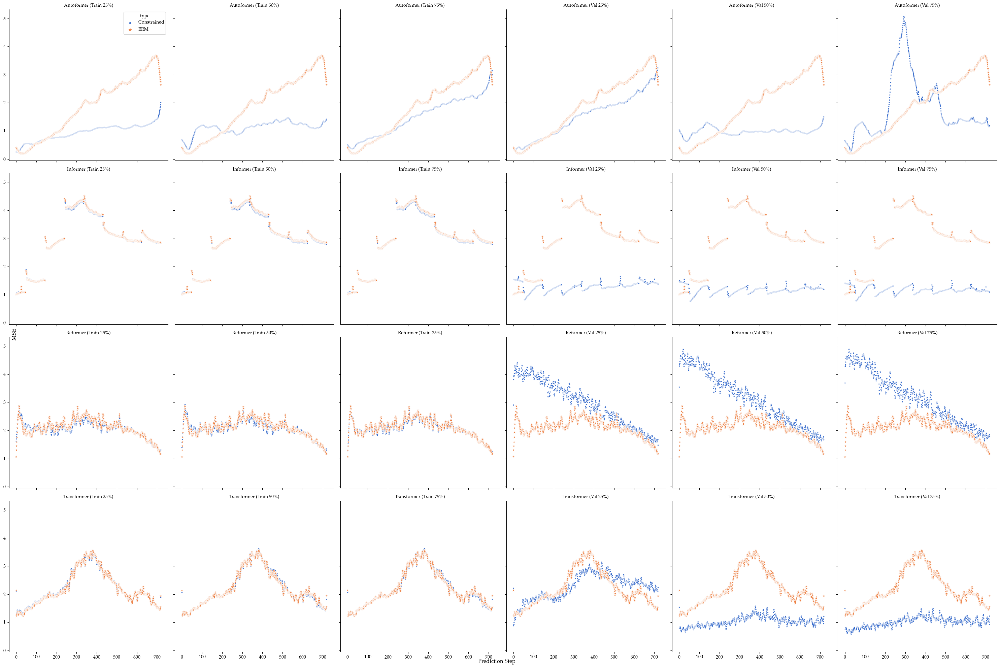

In [34]:
data_path="exchange_rate.csv"
df_this_plot = df_to_plot_nogs.query('pred_len==720 and data_path==@data_path and split=="test" and constraint_idx > 0 and constraint_type!="constant_resilience"').copy()
df_this_plot = df_this_plot[(df_this_plot.constraint_type.isin(['erm','constant'])) & (df_this_plot.model.isin(["Autoformer","Reformer","Transformer","Informer"]))]
df_this_plot = df_this_plot.sort_values(['model','data_path','constraint_type','constraint_idx'])
# Replace constraint_idx values 1,2,3,4,5,6 with some strings
df_this_plot['constraint_idx'] = df_this_plot['constraint_idx'].replace({
    1: "Train 25\%", 
    2: "Train 50\%", 
    3: "Train 75\%", 
    4: "Val 25\%", 
    5: "Val 50\%", 
    6: "Val 75\%"  
})

# grid = sns.FacetGrid(df_this_plot,row='model',col='constraint_idx',hue='constraint_type')
# grid.map(sns.scatterplot,'step','mse')
# The above plot but with relplot
g = sns.relplot(
    df_this_plot,
    x='step',y='mse',
    col='constraint_idx',
    row='model',
    hue='type',style="type",
    markers=MARKER_PER_TYPE,
    kind='scatter',
    facet_kws={
        "legend_out": False,
    }
    )
g.set_xlabels("")
g.set_ylabels("")
g.set_titles(template="{row_name} ({col_name})")
g.fig.supxlabel("Prediction Step")
g.fig.supylabel("MSE")
#g.fig.suptitle(f'{pretty_name_dataset(data_path)}')
g.savefig(f"{FIGURES_FOLDER}/epsilon_sensitivity_exchange_rate_720.pdf")

# Pivot with col being constraint_idx and row being data path and model, with values being mse

### PAPER: Singular ERM vs Constrained 
Of ERM vs constrained

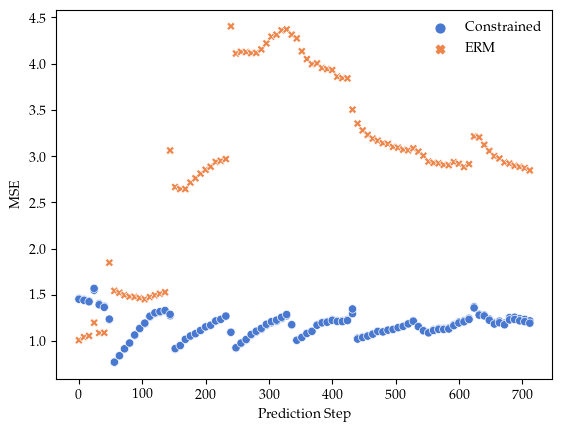

In [36]:
# #Option 1
# model="Autoformer"
# data_path="exchange_rate.csv"
# pred_len=336
# split='test'

# # Option 2
# model="Transformer"
# data_path="exchange_rate.csv"
# pred_len=720
# split='test'

# # Option 3
model="Informer"
data_path="exchange_rate.csv"
pred_len=720
split='test'

# # Option 4
# model="Autoformer"
# data_path="weather.csv"
# pred_len=96
# split='test'

#seaborn params
set_plot_config_paper()

# Filter data
to_plot = df_to_plot.query('model==@model & data_path==@data_path & pred_len==@pred_len & split==@split').copy()
to_plot.loc[to_plot.constraint_level==-1.0,'constraint_level'] = to_plot.constraint_level.max()

#Sample every other datapoint
to_plot = to_plot[to_plot.step%8==0]

to_plot.rename(columns={'mse':'MSE','step': "Prediction Step"},inplace=True)
#display(to_plot.constraint_level)
g = sns.scatterplot(data=to_plot,
                    x="Prediction Step",
                    y= "MSE", 
                    hue='type',
                    style='type',
                    markers=MARKER_PER_TYPE_BIG,
                    palette=constrained_vs_erm_color_palette,
                    #marker='+',
                    #palette={'ERM':'blue','Constrained':'red'},
                    legend='full'
                    )
#g.set_title(f"{model} on {data_path} (pred_len={pred_len}, split={split})")
#plt.figure(figsize=(3.5, 2.6))  # Width, height in inches (standard on papers according to chatGPT)

# remove borders from legend
g.get_legend().get_frame().set_linewidth(0.0)
g.get_legend().set_title("")

# Set the size of the markers
g.legend_.legendHandles[0]._sizes = [40]

plt.savefig(f'../figures/icml/erm_vs_constrained_fp_{model}_{data_path[:4]}_{pred_len}.pdf', bbox_inches='tight')  # For a PGF file
#g2 = sns.lineplot(data=to_plot.query("constraint_type=='constant'"),x="Prediction Step",y= "constraint_level", alpha=.7,color='green',label='Constraint Level')

### PAPER: ERM vs. Constrained on 50th percentile on all datasets (one seed, gridesarched)
nonresilience

In [37]:
# #TODO DELETE OLD VERSION OF PAPER PLOT
# # PARAMS
# split="test"
# #constraint_idx = 1 # use the 50 percentile constraint to plot 1=25,2=50,3=75
# seed=2021

# # Filter
# df_pct50_and_erm = df_to_plot[(df_to_plot.split==split) & (df_to_plot.constraint_type!='constant_resilience')].copy()

# PRED_LENS=sorted(df_to_plot.pred_len.unique().tolist())
# #PRED_LENS=[720]
# #PRED_LENS=[96]

# def sample_every_n(df,groupcols=['data_path','model','pred_len','split'],n=2):
#     """
#     Returns DF but only every nth row with respect to step within each group.
#     """
#     df_sampled = df.groupby(groupcols).apply(lambda x: x[(x.step//48)%n==0]).reset_index(drop=True)
#     return df_sampled
    

# #for pred_len in PRED_LENS:
# for data_path in df_pct50_and_erm.data_path.unique():
#     # Add data for constant line
#     df_current_plot = df_pct50_and_erm.query('data_path==@data_path').copy()
#     df_current_plot['constraint_type'].replace({'erm':'ERM','constant':'Constrained'},inplace=True)

#     g = sns.FacetGrid(
#                     #sample_every_n(df_current_plot),
#                     df_current_plot,
#                     #df_current_plot,
#                     row='model', 
#                     col='pred_len', 
#                     hue='type',
#                     height=3, 
#                     aspect=1.0, 
#                     legend_out=False,
#                     #legend='full',
#                     sharex=False,
#                     sharey=True,
#                     )
#     #g.set_titles(row_template="", col_template="")
    
#     #g.map(sns.lineplot, "step", "mse", alpha=0.7,legend='full',marker='+')
#     # TODO: before, delete
#     #g.map(sns.scatterplot, "step", "mse",marker='+',alpha=0.7,legend='full',edgecolor=None)
#     #after
#     g.map(sns.scatterplot, "step", "mse",alpha=0.7,legend='full',marker='+',edgecolor=None)
#     #g.map(sns.relplot, "step", "mse",alpha=0.7,legend='full',edgecolor=None)
#     g.add_legend()
    
#     g.set_xlabels("")
#     g.set_ylabels("")
#     g.set_titles(template="{row_name} ({col_name})")
#     g.fig.supxlabel("Prediction Step")
#     g.fig.supylabel("MSE")
#     g.fig.suptitle(f'{pretty_name_dataset(data_path)}')
#     for ax in g.axes.flat:
#         ax.set_title(ax.get_title(), fontsize='small')
#         ax.set_xlabel(ax.get_xlabel(), fontsize='large')
#         ax.set_ylabel(ax.get_ylabel(), fontsize='large')

#     # make markers bigger
#     for ax in g.axes.flat:
#         for p in ax.patches:
#             p.set( markersize=20)
#     # disable legend
#     #g._legend.remove()
#     g._legend.set_title("")
#     # legend fontsizesmall
#     #g._legend.texts
#     #g._legend.set_frame_on(False)
#     # tight layout
#     g.fig.tight_layout()
    
#     #TODO fix and uncomment
#     name_without_extension = data_path.split(".")[0]
#     g.savefig(f"{FIGURES_FOLDER}/constrained_vs_erm_all_{name_without_extension}.pdf")
#     plt.show()

In [38]:
dd_debug = df_pct50_and_erm.query("model=='Pyraformer' and constraint_type=='constant' and split=='test'")
# Group MSEs
dd_interm1 = dd_debug.groupby(['data_path', 'pred_len', 'run_id'])['mse'].mean().reset_index().sort_values(['data_path', 'pred_len', 'mse'], ascending=True)

# Count the number of runs for each (data_path, pred_len) key
run_counts = dd_interm1.groupby(['data_path', 'pred_len']).size()

# Filter to include only keys with more than one run
dd_interm1_filtered = dd_interm1[dd_interm1.set_index(['data_path', 'pred_len']).index.isin(run_counts[run_counts > 1].index)]

# Get the run IDs of the lowest MSE for each filtered key
dd_lowest_mse_runs = dd_interm1_filtered.groupby(['data_path', 'pred_len']).first()['run_id']

# Display the results
display(dd_interm1_filtered)
display(dd_lowest_mse_runs.values)

NameError: name 'df_pct50_and_erm' is not defined

In [ ]:
# # Useful for debugging for one model.
# dd_debug = df_pct50_and_erm.query("model=='Pyraformer' and constraint_type=='erm' and split=='test'")#and data_path==''
# dd_debug = dd_debug[~dd_debug.run_id.isin(['8ebn797a', 'f3h5d2k9', 'l4zii0ej', 'nusqty14', 'v2aqitjd','2u2orrgj', 'bbedl2fm', 'lqqgbl0c'])]
# sns.relplot(data=dd_debug,x='step',y='mse',row='data_path',col='pred_len',hue='run_id',facet_kws={'sharex':False,'sharey':True})

In [ ]:
ax=g.axes[0][0]
# Get color values
face_color = ax.get_facecolor()
bottom_edge_color = ax.spines['bottom'].get_edgecolor()
top_edge_color = ax.spines['top'].get_edgecolor()
right_edge_color = ax.spines['right'].get_edgecolor()
left_edge_color = ax.spines['left'].get_edgecolor()

# Print color values
print("Face Color:", face_color)
print("Bottom Edge Color:", bottom_edge_color)
print("Top Edge Color:", top_edge_color)
print("Right Edge Color:", right_edge_color)
print("Left Edge Color:", left_edge_color)
plt.figure(axes=ax)
plt.show()

In [ ]:
# Version 2
# PARAMS
split="test"
#constraint_idx = 1 # use the 50 percentile constraint to plot 1=25,2=50,3=75
seed=2021

# Filter
df_pct50_and_erm = df_to_plot[(df_to_plot.split==split) & (df_to_plot.constraint_type!='constant_resilience')].copy()
df_pct50_and_erm= df_to_plot.query('split==@split and constraint_type in ["erm","constant"]')

PRED_LENS=sorted(df_to_plot.pred_len.unique().tolist())
#PRED_LENS=[720]
#PRED_LENS=[96]

def sample_every_n(df,groupcols=['data_path','model','pred_len','split'],n=2):
    """
    Returns DF but only every nth row with respect to step within each group.
    """
    df_sampled = df.groupby(groupcols).apply(lambda x: x[(x.step//48)%n==0]).reset_index(drop=True)
    return df_sampled
    

#for pred_len in PRED_LENS:
#TODO rollback after debugging
for data_path in df_pct50_and_erm.data_path.unique():
#for data_path in [df_pct50_and_erm.data_path.unique()[0]]:
    # Add data for constant line
    df_current_plot = df_pct50_and_erm.query('data_path==@data_path').copy()
    df_current_plot['constraint_type'].replace({'erm':'ERM','constant':'Constrained'},inplace=True)
    
    g = sns.relplot(
        x='step',
        y='mse',
        data=df_current_plot,
        row='model', 
        col='pred_len',
        hue='type',
        style='type',
        markers=MARKER_PER_TYPE,
        palette=constrained_vs_erm_color_palette,
        #markers={'ERM':'X','Constrained':'.'},
        #marker='+',
        #marker='line',
        #kind='line',
        #edgecolor=None,
        height=3, 
        aspect=1.0,
        alpha=0.7,
        legend='full',
        # Facet level arguments
        facet_kws={
            #'sharex': 'col', #makes sense, but it's easier to read if they're not shared
            'sharex': False,
            'sharey': 'row', 
            'legend_out': False,
        }
    )
    #g.add_legend()
    
    g.set_xlabels("")
    g.set_ylabels("")
    g.set_titles(template="{row_name} ({col_name})")
    g.fig.supxlabel("Prediction Step")
    g.fig.supylabel("MSE")
    g.fig.suptitle(f'{pretty_name_dataset(data_path)}')
    for ax in g.axes.flat:
        ax.set_title(ax.get_title(), fontsize='small')
        ax.set_xlabel(ax.get_xlabel(), fontsize='large')
        ax.set_ylabel(ax.get_ylabel(), fontsize='large')

    # make markers bigger
    for ax in g.axes.flat:
        for p in ax.patches:
            p.set(markersize=20)
    # disable legend
    #g._legend.remove()
    g._legend.set_title("")
    # legend fontsizesmall
    #g._legend.texts
    #g._legend.set_frame_on(False)
    # tight layout
    g.fig.tight_layout()
    
    #TODO fix and uncomment
    name_without_extension = data_path.split(".")[0]
    g.savefig(f"{FIGURES_FOLDER}/constrained_vs_erm_all_{name_without_extension}.pdf")
    plt.show()

### PAPER: ERM Vs Constrained parameterized on split (NO GS)
Using non gridsearch data to explore the results

In [ ]:
# PARAMS
split="test"
constraint_idx = 1 # use 25% to see the highest multipliers to plot 1=25,2=50,3=75
seed=2021

sns.set_palette("muted")
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.serif": ["Palatino"],
})
mpl.rcParams['lines.linewidth'] = 1.8

# Filter
df_pct50_and_erm = df_to_plot_nogs[(df_to_plot_nogs.seed==seed) & 
                                   (df_to_plot_nogs.split==split) & 
                                   (df_to_plot_nogs.constraint_type!='constant_resilience') & 
                                   (df_to_plot_nogs.constraint_idx==constraint_idx)].copy()

PRED_LENS=sorted(df_to_plot_nogs.pred_len.unique().tolist())
#PRED_LENS=[720]
#PRED_LENS=[96]

def pretty_name_dataset(data_path):
    if data_path=="electricity.csv": 
        return "Electricity"
    if data_path=="weather.csv":
        return "Weather"
    if data_path=="exchange_rate.csv":
        return "Exchange Rate"
    if data_path=="traffic.csv":
        return "Traffic"
    if data_path=="national_illness.csv":
        return "Illness"
    else: 
        print(f"Warning didnt find dataset {data_path}")
        return data_path

def sample_every_n(df,groupcols=['data_path','model','pred_len','split'],n=2):
    """
    Returns DF but only every nth row with respect to step within each group.
    """
    df_sampled = df.groupby(groupcols).apply(lambda x: x[(x.step//48)%n==0]).reset_index(drop=True)
    return df_sampled
    

#for pred_len in PRED_LENS:
for data_path in df_pct50_and_erm.data_path.unique():
    # Add data for constant line
    #df_current_plot = df_pct50_and_erm.query('pred_len==@pred_len').copy()
    df_current_plot = df_pct50_and_erm.query('data_path==@data_path').copy()
    df_current_plot['constraint_type'].replace({'erm':'ERM','constant':'Constrained'},inplace=True)
    #constraint_level = df_current_plot.constraint_level.unique()[0]
    #df_current_plot['constraint_level'] = constraint_level
    #display(Markdown(f"#### **ERM Vs Constrained {pred_len} (split={split})**"))

    g = sns.FacetGrid(
                    #sample_every_n(df_current_plot),
                    df_current_plot,
                    #df_current_plot,
                    row='model', 
                    col='pred_len', 
                    hue='constraint_type', 
                    height=3, 
                    aspect=1.0, 
                    legend_out=False,
                    #legend='full',
                    sharex=False,
                    sharey=False,
                    )
    #g.set_titles(row_template="", col_template="")
    
    #g.map(sns.lineplot, "step", "constraint_level", alpha=.7)
    g.map(sns.scatterplot, "step", "mse",marker='+',alpha=0.7,legend='full',edgecolor=None)
    g.add_legend()
    
    g.set_xlabels("")
    g.set_ylabels("")
    g.set_titles(template="{row_name} ({col_name})")
    g.fig.supxlabel("Prediction Step")
    g.fig.supylabel("MSE")
    g.fig.suptitle(f'{pretty_name_dataset(data_path)}')
    for ax in g.axes.flat:
        ax.set_title(ax.get_title(), fontsize='small')
        ax.set_xlabel(ax.get_xlabel(), fontsize='large')
        ax.set_ylabel(ax.get_ylabel(), fontsize='large')

    # make markers bigger
    for ax in g.axes.flat:
        for p in ax.patches:
            p.set(markersize=20)
    # disable legend
    #g._legend.remove()
    g._legend.set_title("")
    # legend fontsizesmall
    #g._legend.texts
    #g._legend.set_frame_on(False)
    # tight layout
    g.fig.tight_layout()
    
    #TODO fix and uncomment
    name_without_extension = data_path.split(".")[0]
    g.savefig(f"{FIGURES_FOLDER}/constrained_vs_erm_all_nogs_{name_without_extension}.pdf")
    #plt.show()

### Train vs test

In [ ]:
# PARAMS
#split="test"
#constraint_idx = 1 # use the 50 percentile constraint to plot 1=25,2=50,3=75
seed=2021

# Filter
df_pct50_and_erm = df_to_plot[(df_to_plot.seed==seed) & (df_to_plot.split.isin(['train','test'])) & (df_to_plot.constraint_type.isin(['erm',CONSTRAINT_TYPE]))].copy()

PRED_LENS=sorted(df_to_plot.pred_len.unique().tolist())
#PRED_LENS=[720]
#PRED_LENS=[96]
#for model in df_to_plot.model.unique():
for data_path in df_to_plot.data_path.unique():
    for pred_len in PRED_LENS:
        # Add data for constant line
        df_current_plot = df_pct50_and_erm.query('pred_len==@pred_len and data_path==@data_path').copy()
        mses=df_current_plot.groupby(['model','split','constraint_type'])['mse'].mean().reset_index()
        # plot only if train constant is lower than train erm and test constant is higher than test erm
        # if mses.query('split=="train"').query('constraint_type=="constant"').mse.values[0] < mses.query('split=="train"').query('constraint_type=="erm"').mse.values[0] and \
        #     mses.query('split=="test"').query('constraint_type=="constant"').mse.values[0] > mses.query('split=="test"').query('constraint_type=="erm"').mse.values[0]:
        display(Markdown(f"#### **ERM Vs Constrained {data_path}--{pred_len}**"))
    
        #constraint_level = df_current_plot.constraint_level.unique()[0]
        #df_current_plot['constraint_level'] = constraint_level
        display(Markdown(f"#### **ERM Vs Constrained {data_path}--{pred_len}**"))

        g = sns.FacetGrid(df_current_plot, col='model', row='split', hue='constraint_type', height=3, aspect=1.5, legend_out=True,sharex=False,sharey=False)
        #g.map(sns.lineplot, "step", "constraint_level", alpha=.7)
        g.map(sns.scatterplot, "step", "mse", alpha=.7)
        g.map(sns.lineplot, "step", "constraint_level", alpha=.7)
        g.add_legend()
        #TODO fix and uncomment
        #g.savefig(f"{FIGURES_FOLDER}/constrained_vs_erm_{pred_len}_{str(constraint_level).replace('.','')}.png")
        plt.show()

#### PAPER: Train vs test select example!!!

(424, 129)
success
Constraint levels per model to verify:


,model,constraint_level
202608,Autoformer,0.765
196848,Reformer,0.209


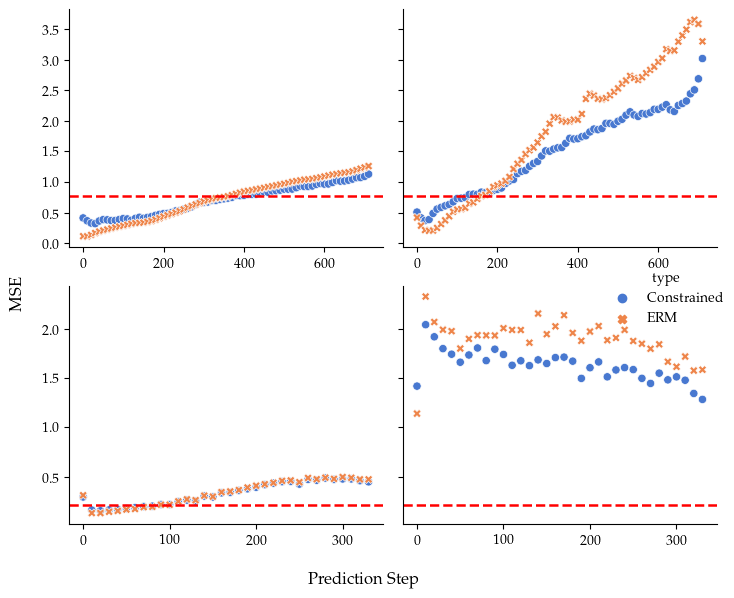

(2112, 129)
failures
Constraint levels per model to verify:


,model,constraint_level
305136,Autoformer,0.392
224640,Informer,0.212


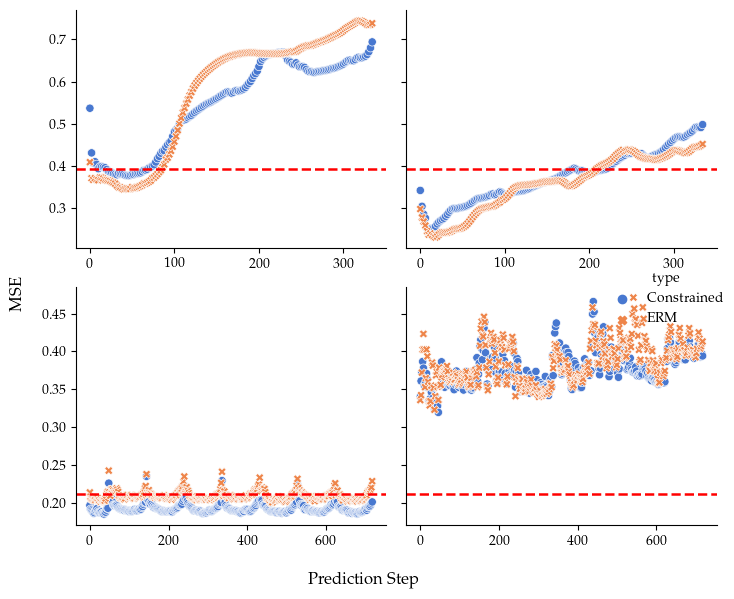

In [31]:
import matplotlib as mpl
# Get the two success cases and two failures cases in separate dfs
# constant and erm
#**ECL192 transformer**
#**Weather 192 REformer
#Drop this one in favor of a more textbook one
#success1 = df_to_plot.query('data_path=="electricity.csv" and pred_len==192 and split!="val" and model=="Transformer" and (constraint_type=="constant" or constraint_type=="erm")').copy()
success1 = df_to_plot.query('data_path=="exchange_rate.csv" and pred_len==720 and split!="val" and model=="Autoformer" and (constraint_type=="constant" or constraint_type=="erm")').copy()
success2 = df_to_plot.query('data_path=="exchange_rate.csv" and pred_len==336 and split!="val" and model=="Reformer" and (constraint_type=="constant" or constraint_type=="erm")').copy()
#**Weather 332 Autoformer**
#**Electricity 720 Informer**
failure1 = df_to_plot.query('data_path=="weather.csv" and pred_len==336 and split!="val" and model=="Autoformer" and (constraint_type=="constant" or constraint_type=="erm")').copy()
failure2 = df_to_plot.query('data_path=="electricity.csv" and pred_len==720 and split!="val" and model=="Informer" and (constraint_type=="constant" or constraint_type=="erm")').copy()
    
# Plot all cases
success = pd.concat([success1,success2])
failures = pd.concat([failure1,failure2])
for plot_data,figname in [
    # (success1,"success_electricity_transformer_192"),
    # (success2,"success_weather_reformer_192"),
    # (failure1,"failure_weather_autoformer_332"),
    # (failure2,"failure_electricity_informer_720")
    (success,"success"),
    (failures,"failures")
    ]:
    # print(failure1.shape)
    # print(failure2.shape)
    if plot_data.pred_len.iloc[0]>500:
        evens = plot_data["step"]%10
        plot_data = plot_data[evens==0]
    # elif plot_data.pred_len.iloc[0]==336:
    #     evens = plot_data["step"]%4
    #     plot_data = plot_data[evens==0]
    else: 
        evens = plot_data["step"]%2
        plot_data = plot_data[evens==0]
    print(plot_data.shape)
    print(figname)
    
    g = sns.relplot(
        data=plot_data,
        x='step',y='mse',
        row="model", #Autoformer,reformer
        col='split', # train, test
        hue='type', 
        style='type',
        height=3, 
        aspect=1.0,
        facet_kws={
            'sharex':False,
            'sharey':'row',
            'legend_out':True,
        }
    )
    
    g.add_legend()
    
    g.set_xlabels("")
    g.set_ylabels("")
    
    g.fig.supxlabel("Prediction Step")
    g.fig.supylabel("MSE")
    plot_constraint_vals=plot_data[['model','constraint_level']].drop_duplicates().constraint_level.tolist()
    print("Constraint levels per model to verify:")
    display(plot_data[['model','constraint_level']].drop_duplicates())
    for i,ax in enumerate(g.axes.flat):
        ax.set_title("", fontsize='large')
        ax.axhline(y=plot_constraint_vals[i//2],color='red',linestyle='--')
        #sns.lineplot(data=)
        ax.set_xlabel(ax.get_xlabel(), fontsize='large')
        ax.set_ylabel(ax.get_ylabel(), fontsize='large')
        
    # Add horizontal lines to each subplot
    # for ax in g.axes.flat:
    #     sns.lineplot()
        #ax.axhline(y=0, color='red', linestyle='--')

    # make markers bigger
    for ax in g.axes.flat:
        for p in ax.patches:
            p.set(markersize=20)
    # disable legend
    g._legend.remove()
    # tight layout
    g.fig.tight_layout()
    g.savefig(f"../figures/icml/{figname}.pdf")
    plt.show()

# g = sns.FacetGrid(df_current_plot, col='model', row='split', hue='constraint_type', height=3, aspect=1.5, legend_out=True,sharex=False,sharey=False)
# #g.map(sns.lineplot, "step", "constraint_level", alpha=.7)
# g.map(sns.scatterplot, "step", "mse", alpha=.7)
# g.add_legend()
# #TODO fix and uncomment
# #g.savefig(f"{FIGURES_FOLDER}/constrained_vs_erm_{pred_len}_{str(constraint_level).replace('.','')}.png")
# plt.show()

## ATTEMPT: train vs test vs multipliers by melting

In [82]:
dd_plot_data = plot_data.query('constraint_type!="erm"')
display(dd_plot_data[['data_path','model','pred_len','type']].drop_duplicates())

dd_plot_data.to_csv('deleteme_debug_data.csv')


,data_path,model,pred_len,type
224640,electricity.csv,Informer,720,Constrained
16416,electricity.csv,Informer,720,Constrained Resilience


#### Train vs test with resilience

(432, 129)
success_electricity_transformer_192


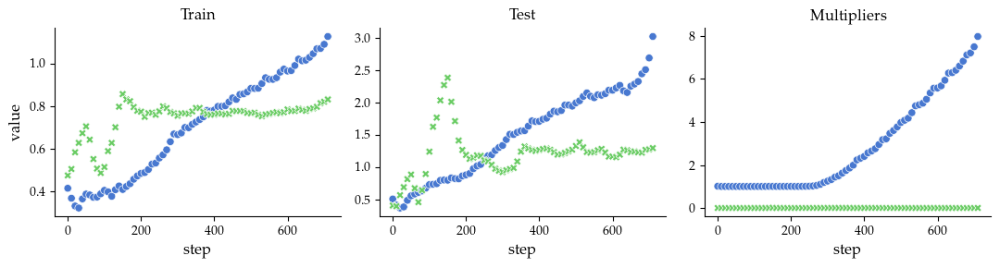

(1008, 129)
success_weather_reformer_192


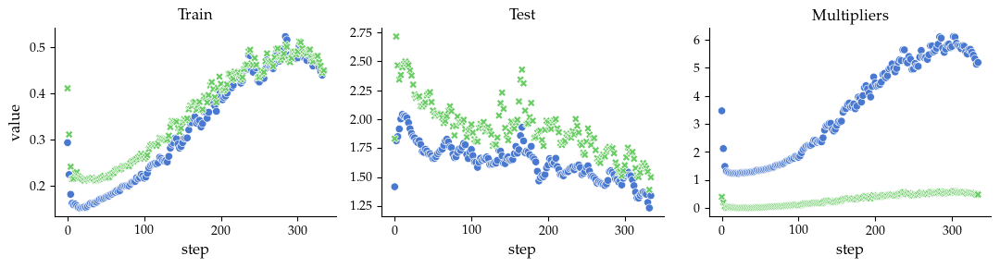

(1008, 129)
failure_weather_autoformer_332


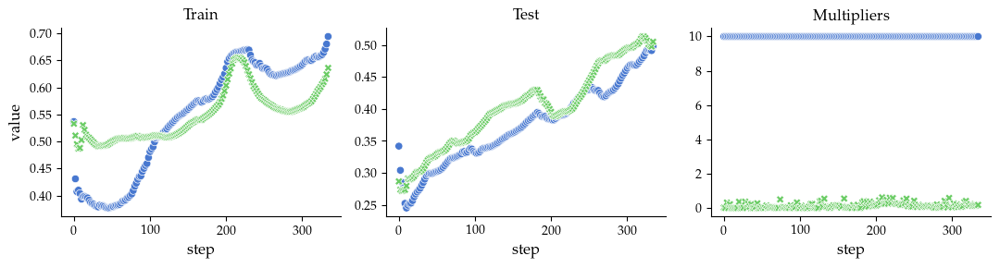

(432, 129)
failure_electricity_informer_720


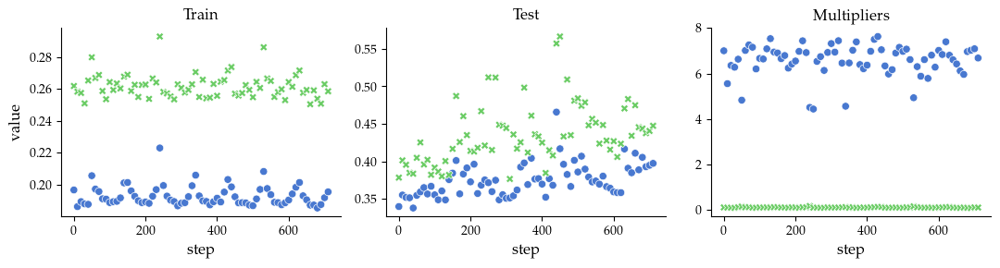

In [98]:
import matplotlib as mpl
# Get the two success cases and two failures cases in separate dfs
# constant and erm
#**ECL192 transformer**
#**Weather 192 REformer
#Drop this one in favor of a more textbook one
#success1 = df_to_plot.query('data_path=="electricity.csv" and pred_len==192 and split!="val" and model=="Transformer" and (constraint_type=="constant" or constraint_type=="erm")').copy()
success1 = df_to_plot.query('data_path=="exchange_rate.csv" and pred_len==720 and split!="val" and model=="Autoformer" and (constraint_type=="constant" or constraint_type=="erm"  or constraint_type=="constant_resilience")').copy()
success2 = df_to_plot.query('data_path=="exchange_rate.csv" and pred_len==336 and split!="val" and model=="Reformer" and (constraint_type=="constant" or constraint_type=="erm"  or constraint_type=="constant_resilience")').copy()
#**Weather 332 Autoformer**
#**Electricity 720 Informer**
failure1 = df_to_plot.query('data_path=="weather.csv" and pred_len==336 and split!="val" and model=="Autoformer" and (constraint_type=="constant" or constraint_type=="erm" or constraint_type=="constant_resilience")').copy()
failure2 = df_to_plot.query('data_path=="electricity.csv" and pred_len==720 and split!="val" and model=="Informer" and (constraint_type=="constant" or constraint_type=="erm"  or constraint_type=="constant_resilience")').copy()

# Plot all cases
success = pd.concat([success1,success2])
failures = pd.concat([failure1,failure2])
for plot_data,figname in [
    (success1,"success_electricity_transformer_192"),
    (success2,"success_weather_reformer_192"),
    (failure1,"failure_weather_autoformer_332"),
    (failure2,"failure_electricity_informer_720")
    # (success,"success"),
    # (failures,"failures")
    ]:
    # print(failure1.shape)
    # print(failure2.shape)
    if plot_data.pred_len.iloc[0]>500:
        evens = plot_data["step"]%10
        plot_data = plot_data[evens==0]
    # elif plot_data.pred_len.iloc[0]==336:
    #     evens = plot_data["step"]%4
    #     plot_data = plot_data[evens==0]
    else: 
        evens = plot_data["step"]%2
        plot_data = plot_data[evens==0]
    print(plot_data.shape)
    print(figname)
    
    # mse_plot = sns.relplot(
    #     data=plot_data.query('constraint_type!="erm"'),
    #     x='step',y='mse',
    #     row="model", #Autoformer,reformer
    #     col='split', # train, test
    #     hue='type', 
    #     style='type',
    #     height=3, 
    #     aspect=1.0,
    #     palette=constrained_vs_erm_color_palette,
    #     facet_kws={
    #         'sharex':False,
    #         'sharey':'row',
    #         'legend_out':False,
    #     }
    # )
    
    # multiplier_plot = sns.relplot(
    #     data=plot_data.query('constraint_type!="erm" and split=="train"'),
    #     x='step',y='multiplier',
    #     row="model", #Autoformer,reformer
    #     col='split', # train, test
    #     hue='type', 
    #     style='type',
    #     palette=constrained_vs_erm_color_palette,
    #     height=3, 
    #     aspect=1.0,
    #     facet_kws={
    #         'sharex':False,
    #         'sharey':'row',
    #         'legend_out':False,
    #     }
    # )
    # Goal: Get a subplot with train mse, test mse, and train multipliers for Constrained vs Constrained resilience.
    melted_data = plot_data.query('constraint_type!="erm"').melt(
        id_vars=['model','data_path','pred_len','split','step','type'],
        value_vars=['mse','multiplier'],
        var_name='metric',
        value_name='value'
    )
    melted_data.loc[(melted_data.split=='train') & (melted_data.metric=='multiplier'), 'split'] = 'dual_variables'

    plot = sns.relplot(
        data=melted_data,
        x='step',
        y='value',
        hue='type',
        style='type',
        col='split',
        row='data_path',
        palette=constrained_vs_erm_color_palette,
        height=3, 
        aspect=1.0,
        facet_kws={
            'sharey': False,
            'sharex': True,
            'legend_out': True
        },
    )
    for title,ax in zip(['Train','Test','Multipliers'],plot.axes.flat):
        ax.set_title(title, fontsize='large')
        #ax.axhline(y=plot_constraint_vals[i//2],color='red',linestyle='--')
        #sns.lineplot(data=)
        ax.set_xlabel(ax.get_xlabel(), fontsize='large')
        ax.set_ylabel(ax.get_ylabel(), fontsize='large')
    plot.fig.tight_layout()
    plot._legend.remove()
    
    
    # MSE Plot customize
    # mse_plot.add_legend()
    # mse_plot.set_xlabels("")
    # mse_plot.set_ylabels("")
    
    # mse_plot.fig.supxlabel("Prediction Step")
    # mse_plot.fig.supylabel("MSE")
    # plot_constraint_vals=plot_data[['model','constraint_level']].drop_duplicates().constraint_level.tolist()
    # print("Constraint levels per model to verify:")
    # display(plot_data[['model','constraint_level']].drop_duplicates())
    # for i,ax in enumerate(mse_plot.axes.flat):
    #     ax.set_title("", fontsize='large')
    #     #ax.axhline(y=plot_constraint_vals[i//2],color='red',linestyle='--')
    #     #sns.lineplot(data=)
    #     ax.set_xlabel(ax.get_xlabel(), fontsize='large')
    #     ax.set_ylabel(ax.get_ylabel(), fontsize='large')
        
    # # Add horizontal lines to each subplot
    # # for ax in g.axes.flat:
    # #     sns.lineplot()
    #     #ax.axhline(y=0, color='red', linestyle='--')

    # # make markers bigger
    # for ax in g.axes.flat:
    #     for p in ax.patches:
    #         p.set(markersize=20)
    # # disable legend
    # mse_plot._legend.remove()
    # # tight layout
    # mse_plot.fig.tight_layout()
    
    # # Multiplier Plot customize
    # multiplier_plot.add_legend()
    # multiplier_plot.set_xlabels("")
    # multiplier_plot.set_ylabels("")
    
    # multiplier_plot.fig.supxlabel("Prediction Step")
    # multiplier_plot.fig.supylabel("Multiplier")
    # plot_constraint_vals=plot_data[['model','constraint_level']].drop_duplicates().constraint_level.tolist()
    # print("Constraint levels per model to verify:")
    # display(plot_data[['model','constraint_level']].drop_duplicates())
    # for i,ax in enumerate(multiplier_plot.axes.flat):
    #     ax.set_title("", fontsize='large')
    #     #ax.axhline(y=plot_constraint_vals[i//2],color='red',linestyle='--')
    #     #sns.lineplot(data=)
    #     ax.set_xlabel(ax.get_xlabel(), fontsize='large')
    #     ax.set_ylabel(ax.get_ylabel(), fontsize='large')
        
    # # Add horizontal lines to each subplot
    # # for ax in g.axes.flat:
    # #     sns.lineplot()
    #     #ax.axhline(y=0, color='red', linestyle='--')

    # # make markers bigger
    # for ax in g.axes.flat:
    #     for p in ax.patches:
    #         p.set(markersize=20)
    # # disable legend
    # multiplier_plot._legend.remove()
    # # tight layout
    # multiplier_plot.fig.tight_layout()
    
    # TODO Saves
    #g.savefig(f"../figures/icml/{figname}.pdf")
    plt.show()

# g = sns.FacetGrid(df_current_plot, col='model', row='split', hue='constraint_type', height=3, aspect=1.5, legend_out=True,sharex=False,sharey=False)
# #g.map(sns.lineplot, "step", "constraint_level", alpha=.7)
# g.map(sns.scatterplot, "step", "mse", alpha=.7)
# g.add_legend()
# #TODO fix and uncomment
# #g.savefig(f"{FIGURES_FOLDER}/constrained_vs_erm_{pred_len}_{str(constraint_level).replace('.','')}.png")
# plt.show()

In [38]:
df_to_plot.query('split=="train"').groupby('constraint_type')['multiplier'].mean().reset_index()

,constraint_type,multiplier
0,constant,1.990705
1,constant_resilience,0.072355
2,erm,0.000000


### REVIEWER REQUEST: Multipliers over the window

In [ ]:
# PARAMS

# Filter
# example_one = df_to_plot[
#     (df_to_plot.constraint_idx.isin([0,constraint_idx])) 
#     & (df_to_plot.split==split)
#     & (df_to_plot.constraint_type=="constant")
#     & (df_to_plot.model=="Autoformer")
#     & (df_to_plot.pred_len==720)
#     ].copy()

example_one = df_to_plot.query('(constraint_type=="constant" or constraint_type=="erm") and data_path=="exchange_rate.csv" and model=="Autoformer" and pred_len==720')
#example_two = df_to_plot_nogs.query('((constraint_type=="constant" and constraint_idx==1) or constraint_type=="erm") and data_path=="weather.csv" and model=="Autoformer" and pred_len==96')
example_two = df_to_plot_nogs.query('((constraint_type=="constant" and constraint_idx==1) or constraint_type=="erm") and data_path=="ETTm1.csv" and model=="Reformer" and pred_len==336')
#display(example_one)
for data in [example_one,example_two]:
#for data in [example_two]:
    g1 = sns.scatterplot(data=data.query('split=="test"'),x="step", y="mse",hue='constraint_type')#, alpha=.7,color='red',label='Multiplier')
    g1.set_title("ERM vs Constrained")
    plt.show()
    g2 = sns.scatterplot(data=data.query("constraint_type=='constant'"),x="step", y="multiplier")#, alpha=.7,color='red',label='Multiplier')
    g2.legend()
    g2.set_title("Multipliers")
    plt.show()


In [ ]:
# PRED_LENS=sorted(df_to_plot.pred_len.unique().tolist())
# #PRED_LENS=[96]
# for pred_len in PRED_LENS:
#     # Add data for constant line
#     df_current_plot = df_pct50.query('pred_len==@pred_len').copy()
#     #constraint_level = df_current_plot.constraint_level.unique()[0]
#     #df_current_plot['constraint_level'] = constraint_level
#     display(Markdown(f"#### **Multipliers vs loss {pred_len} (split={split}, constraint_idx={constraint_idx})**"))

#     g = sns.FacetGrid(df_current_plot, col='model', row='data_path', height=3, aspect=1.5, legend_out=True)
#     # Plot multipliers and MSEs
#     g.map(sns.scatterplot, "step", "mse", alpha=.7,color='blue',label='MSE')
#     g.map(sns.scatterplot, "step", "multiplier", alpha=.7,color='red',label='Multiplier')
#     # Add legend the series

#     g.add_legend()
#     #g.savefig(f"{FIGURES_FOLDER}/constrained_vs_erm_{pred_len}_{str(constraint_level).replace('.','')}.png")
#     plt.show()

### ALL Multipliers vs loss

#### **Multipliers vs loss 24 (split=train, constraint_idx=1)**

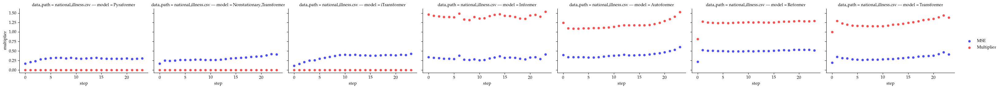

#### **Multipliers vs loss 36 (split=train, constraint_idx=1)**

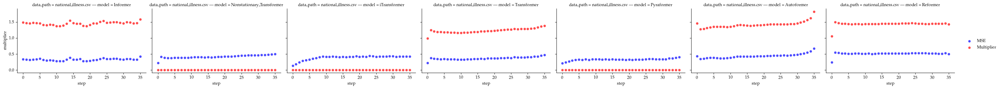

#### **Multipliers vs loss 48 (split=train, constraint_idx=1)**

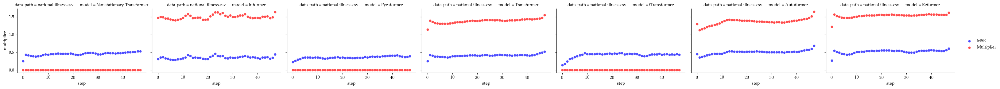

#### **Multipliers vs loss 60 (split=train, constraint_idx=1)**

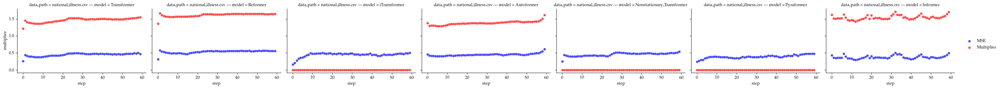

#### **Multipliers vs loss 96 (split=train, constraint_idx=1)**

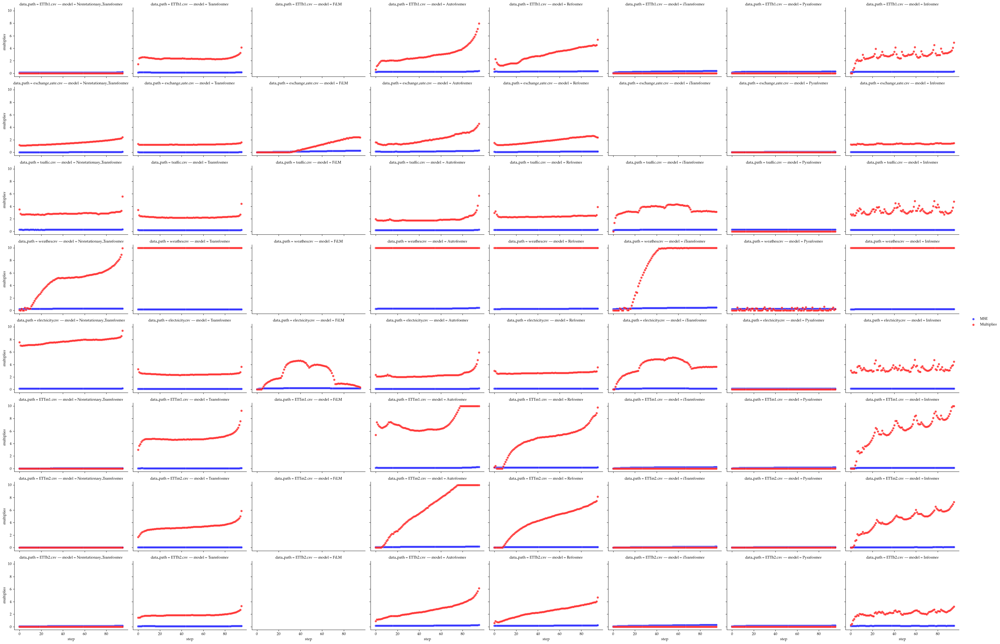

#### **Multipliers vs loss 192 (split=train, constraint_idx=1)**

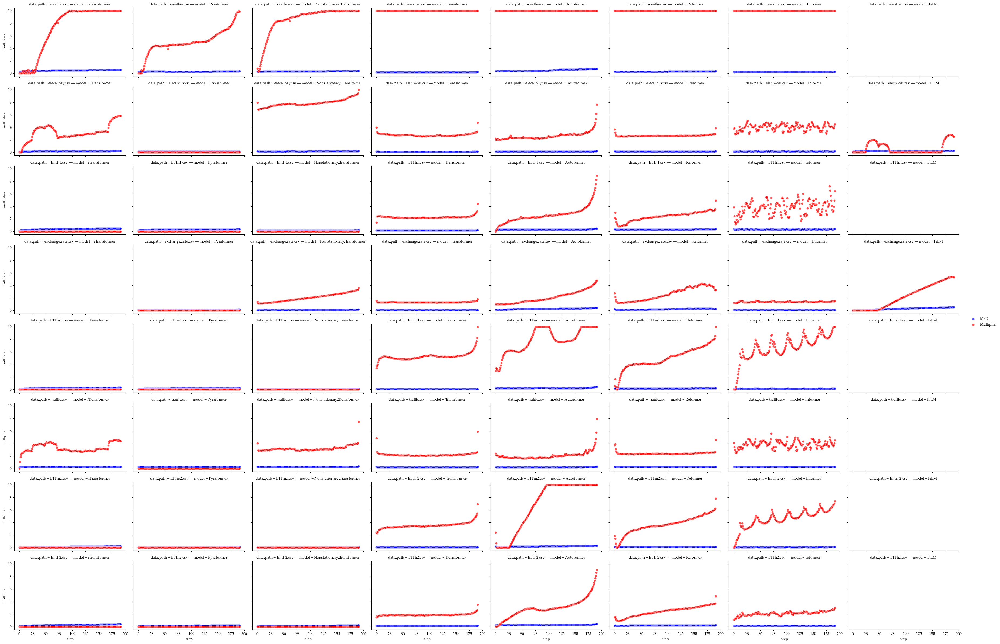

#### **Multipliers vs loss 336 (split=train, constraint_idx=1)**

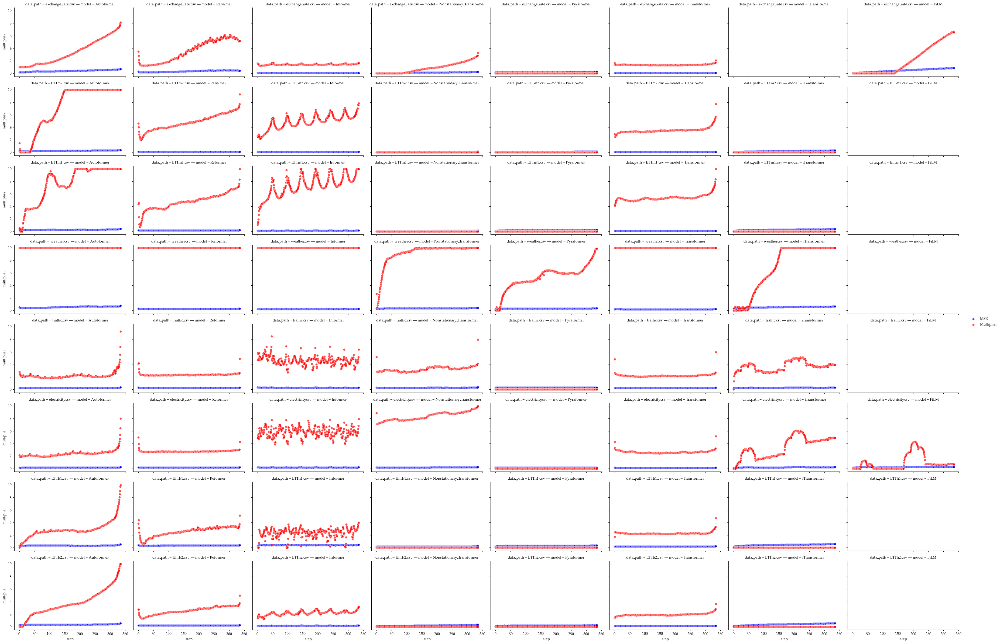

#### **Multipliers vs loss 720 (split=train, constraint_idx=1)**

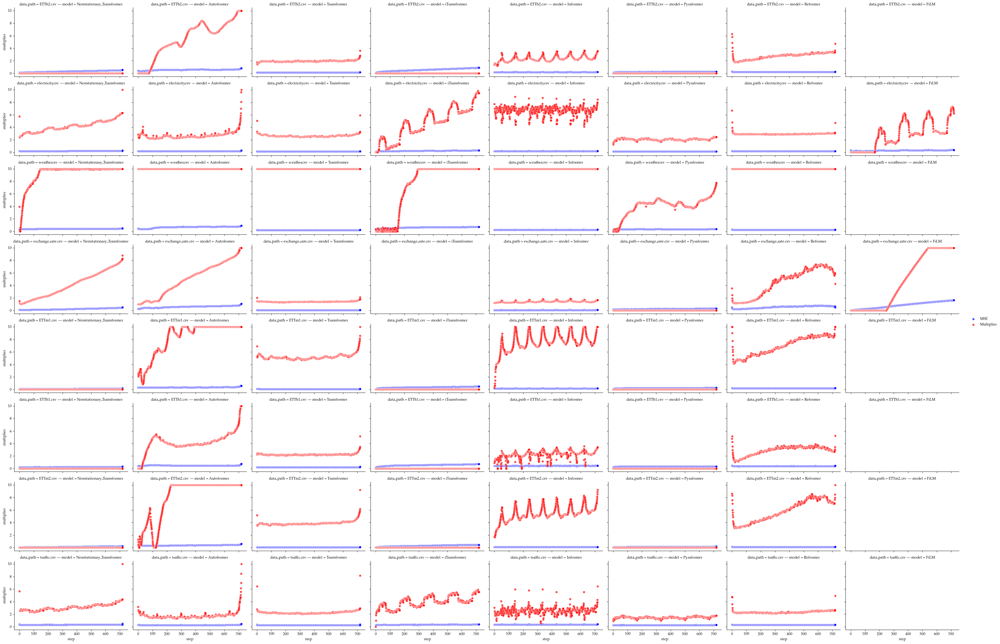

In [39]:
# PARAMS
split="train"
constraint_idx = 1 # use the 50 percentile constraint to plot 1=25,2=50,3=75
seed=2021

# Filter
df_pct50 = df_to_plot_nogs[
    (df_to_plot_nogs.constraint_idx.isin([0,constraint_idx])) 
    & (df_to_plot_nogs.seed==seed) & (df_to_plot_nogs.split==split)
    & (df_to_plot_nogs.constraint_type=="constant")
    ].copy()

PRED_LENS=sorted(df_to_plot_nogs.pred_len.unique().tolist())
#PRED_LENS=[96]
for pred_len in PRED_LENS:
    # Add data for constant line
    df_current_plot = df_pct50.query('pred_len==@pred_len').copy()
    #constraint_level = df_current_plot.constraint_level.unique()[0]
    #df_current_plot['constraint_level'] = constraint_level
    display(Markdown(f"#### **Multipliers vs loss {pred_len} (split={split}, constraint_idx={constraint_idx})**"))

    g = sns.FacetGrid(df_current_plot, col='model', row='data_path', height=3, aspect=1.5, legend_out=True)
    # Plot multipliers and MSEs
    g.map(sns.scatterplot, "step", "mse", alpha=.7,color='blue',label='MSE')
    g.map(sns.scatterplot, "step", "multiplier", alpha=.7,color='red',label='Multiplier')
    # Add legend the series

    g.add_legend()
    #g.savefig(f"{FIGURES_FOLDER}/multipliers_vs_loss_{pred_len}_{str(constraint_level).replace('.','')}.png")
    plt.show()

### Multipliers constant vs resilience (optimal)

In [49]:
df_to_plot.constraint_type.unique()
CONSTRAINT_TYPE

'constant'

#### **Multipliers Constrained vs Resilience ETTh1.csv**

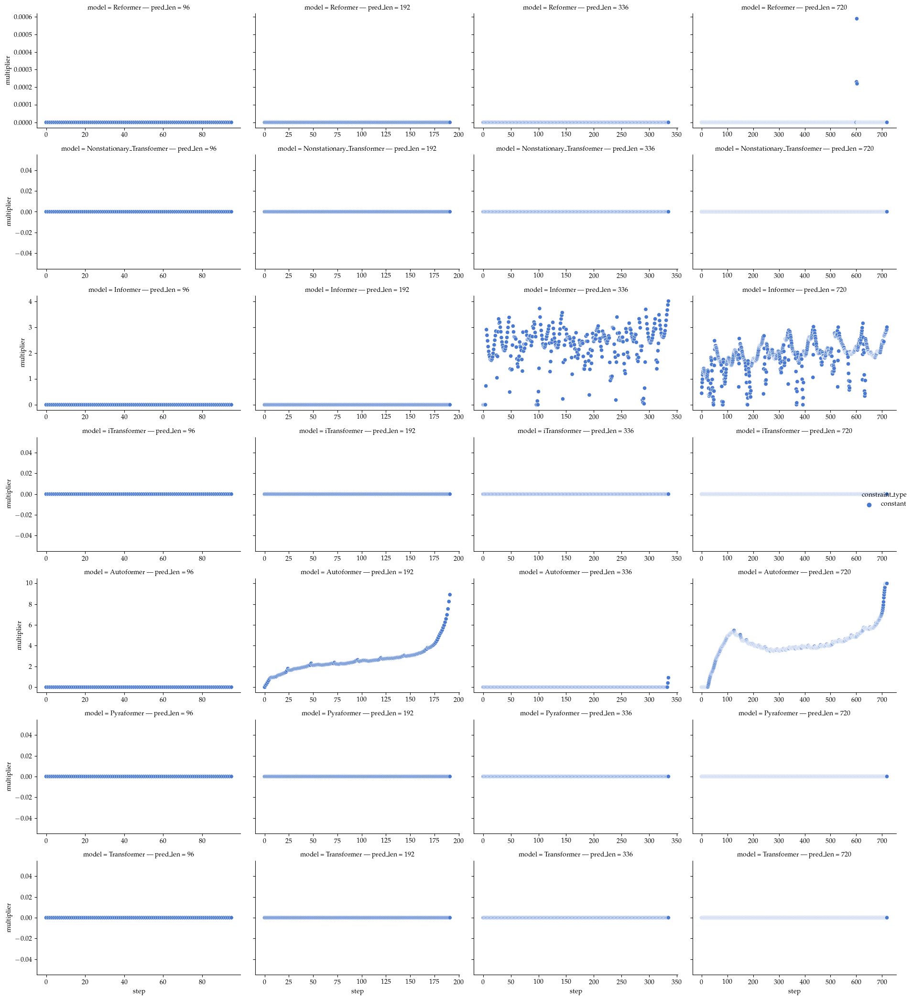

#### **Multipliers Constrained vs Resilience weather.csv**

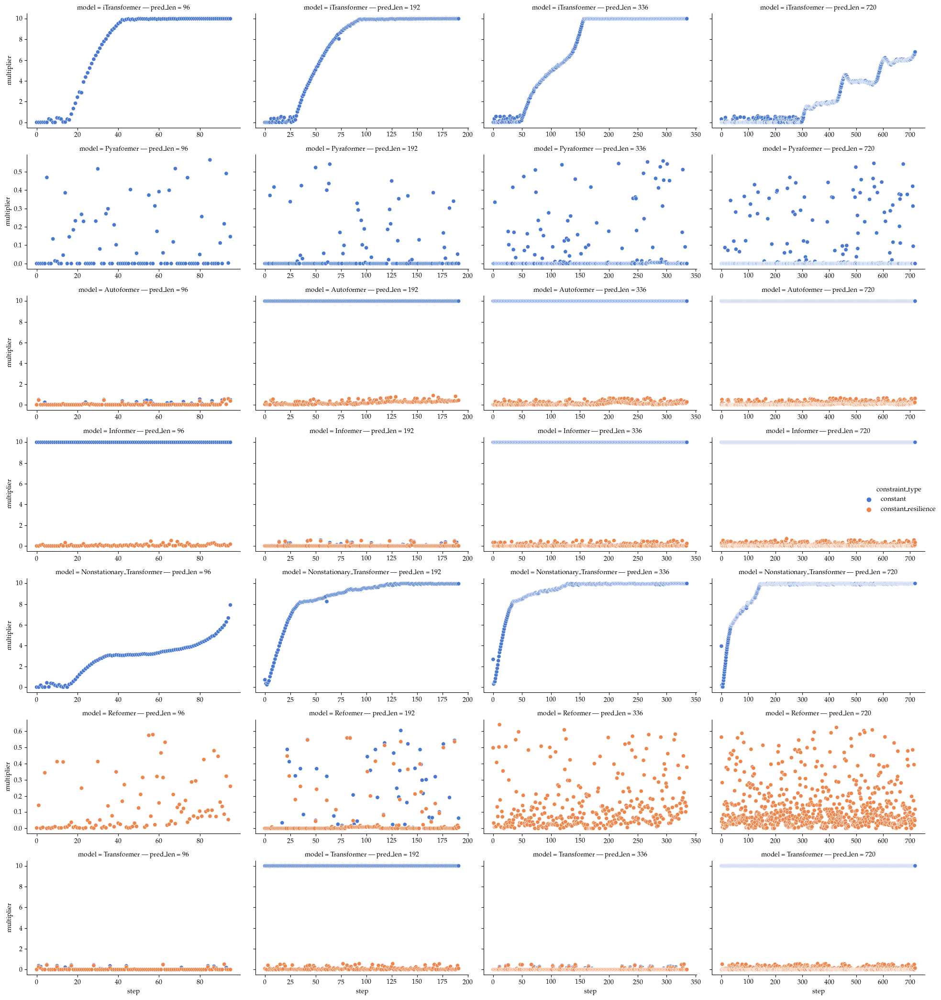

#### **Multipliers Constrained vs Resilience ETTh2.csv**

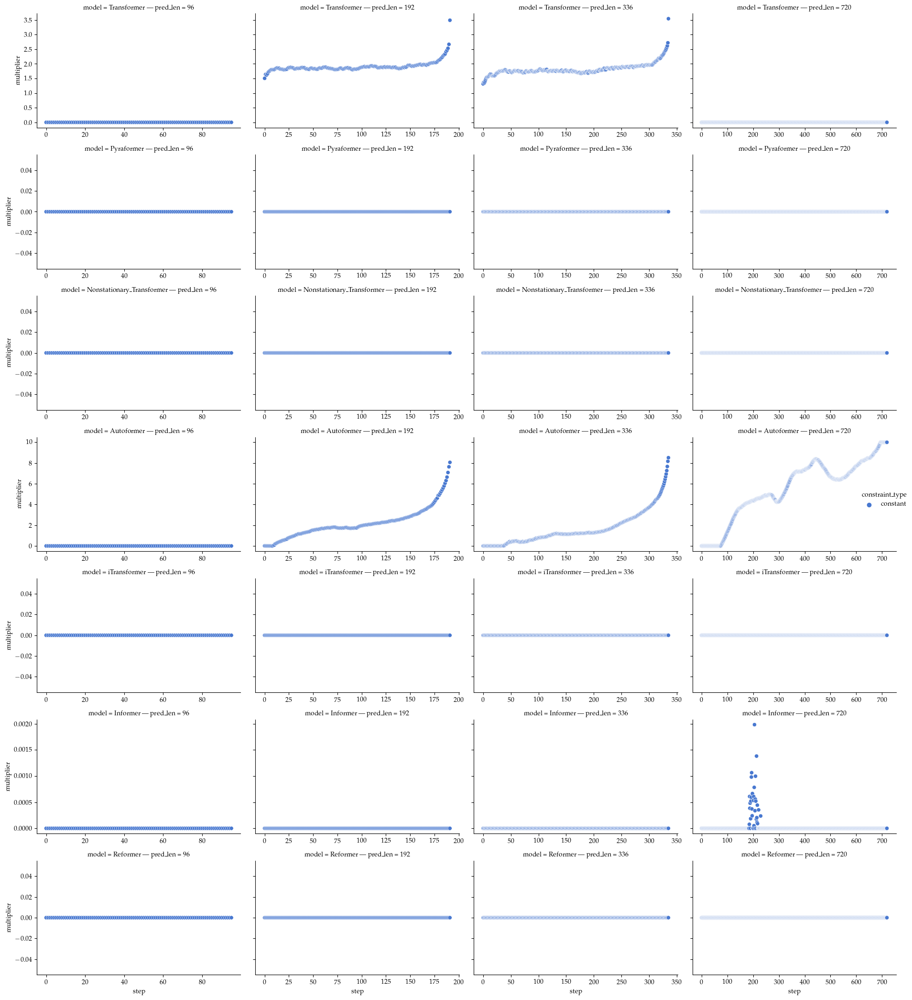

#### **Multipliers Constrained vs Resilience electricity.csv**

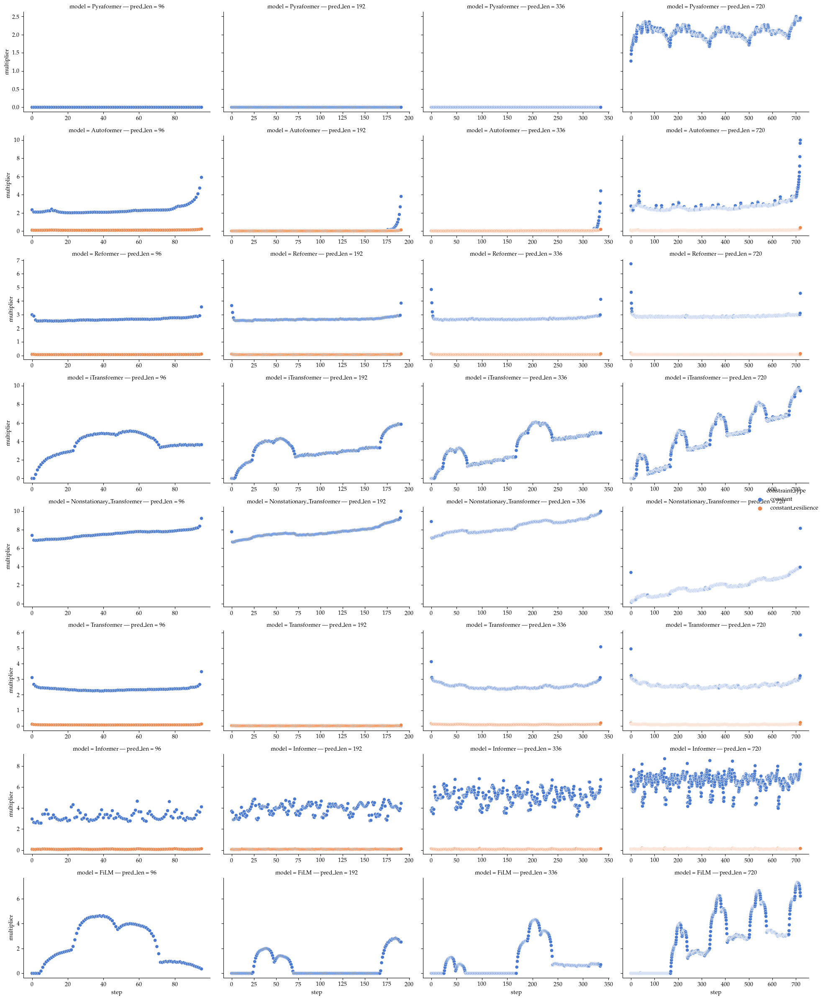

#### **Multipliers Constrained vs Resilience exchange_rate.csv**

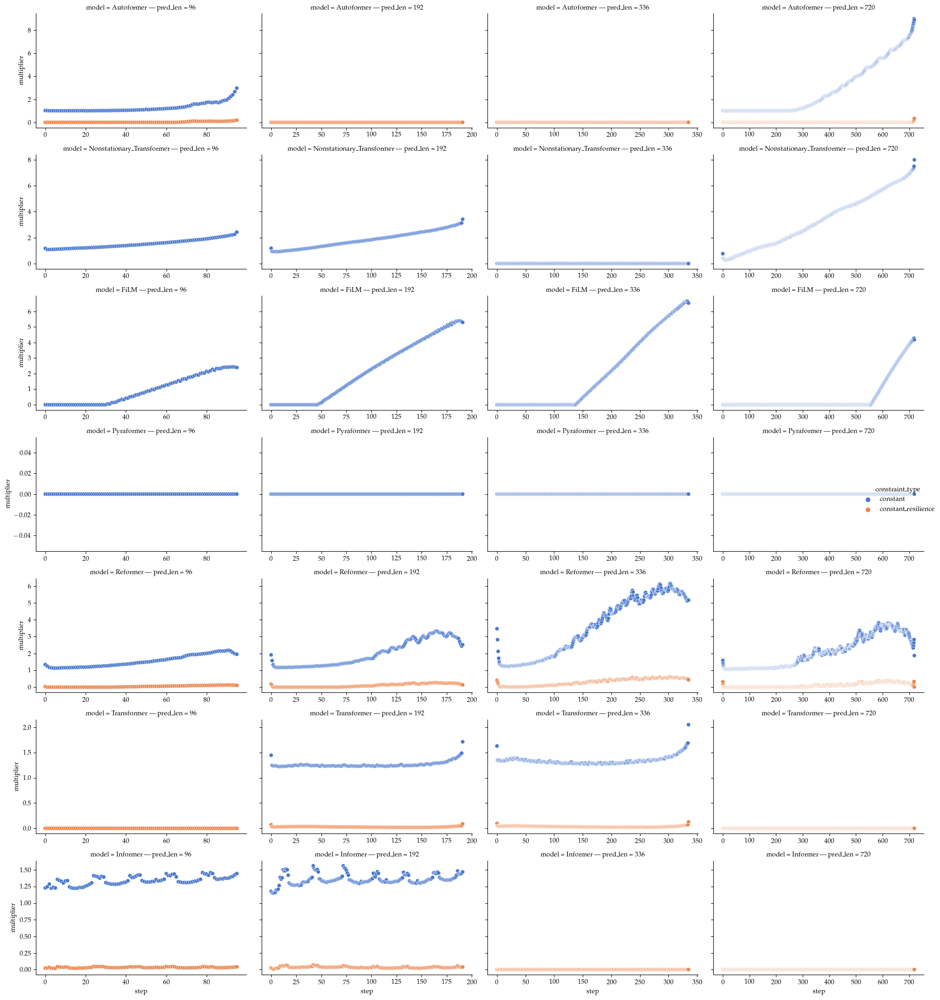

#### **Multipliers Constrained vs Resilience traffic.csv**

KeyboardInterrupt: 

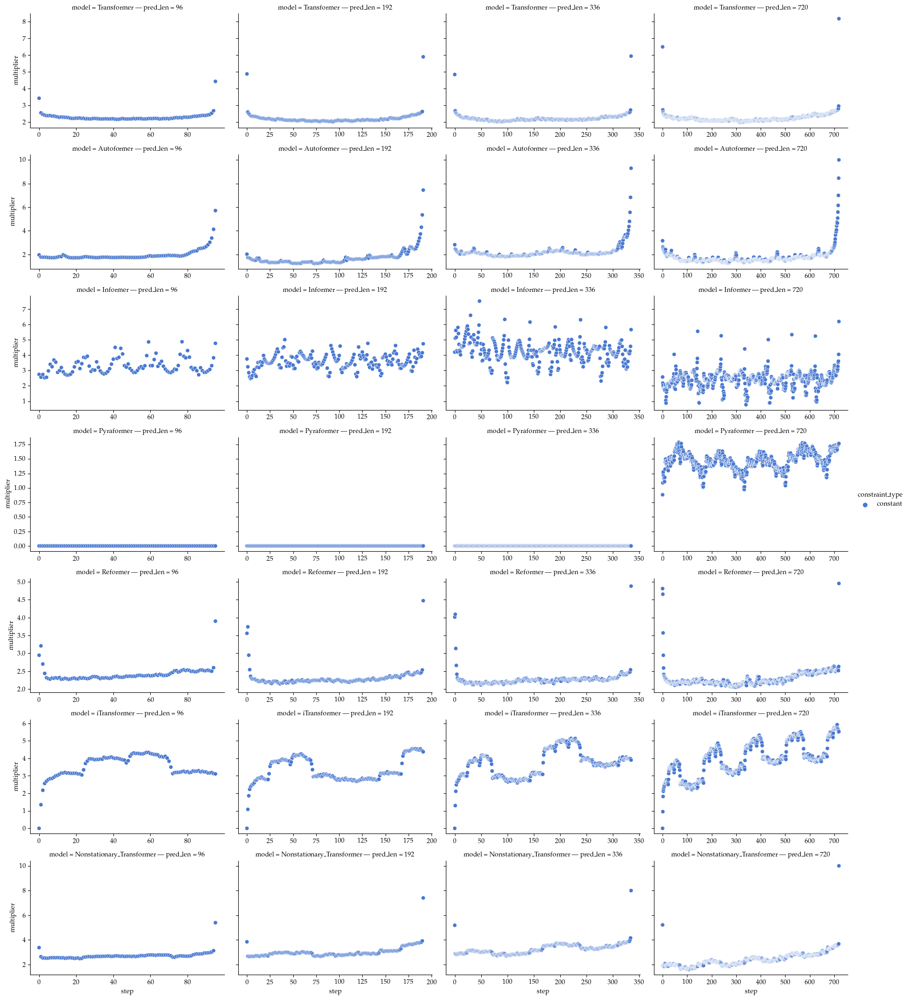

In [90]:
# PARAMS
split="train"
#constraint_idx = 1 # use the 50 percentile constraint to plot 1=25,2=50,3=75
seed=2021

# Filter
df_pct50 = df_to_plot[
    (df_to_plot.seed==seed) & (df_to_plot.split==split)
    & (df_to_plot.constraint_type.isin([CONSTRAINT_TYPE,f"{CONSTRAINT_TYPE}_resilience"]))
    ].copy()

PRED_LENS=sorted(df_pct50.pred_len.unique().tolist())
DATA_PATHS=df_pct50.data_path.unique()

#PRED_LENS=[96]
for data_path in DATA_PATHS:
    # Add data for constant line
    df_current_plot = df_pct50.query('data_path==@data_path').copy()
    display(Markdown(f"#### **Multipliers Constrained vs Resilience {data_path}**"))
    g = sns.relplot(
        data=df_current_plot,
        x='step',
        y='multiplier',
        hue='constraint_type',
        row='model',
        col='pred_len',
        height=3, 
        aspect=1.5,
        facet_kws={
            'sharex': False,
            'sharey': 'row'
        }
    )

    g.add_legend()
    #g.savefig(f"{FIGURES_FOLDER}/multipliers_vs_loss_{pred_len}_{str(constraint_level).replace('.','')}.png")
    plt.show()

### Is train correlated with test?

In [ ]:
model="Autoformer"
data_path="exchange_rate.csv"
pred_len=720

dd=df_to_plot.query('model==@model & data_path==@data_path & type=="ERM" & pred_len==@pred_len')
# Create a dataset of mse train and mse test for each step with dd using melt
dd_train = dd.query('split=="train"').copy()
dd_test = dd.query('split=="test"').copy()

dd_plot=dd_train.merge(dd_test,on="step",suffixes=('_train','_test'))[['step','mse_train','mse_test']]
#dd2['diff'] = dd2.test-dd2.train

sns.scatterplot(dd_plot, x="mse_train", y="mse_test", alpha=.7,)

### PAPER: ERM vs Constrained across models on two datasets

In [ ]:
df_set1 = df_to_plot.query('data_path=="exchange_rate.csv" and pred_len==720 and split=="test"').copy()
df_set2 = df_to_plot.query('data_path=="weather.csv" and pred_len==96 and split=="test"').copy()

# filter to og
df_set1 = df_set1.query("model in @og_models")
df_set2 = df_set2.query("model in @og_models")

#plot 1
g=sns.FacetGrid(df_set1, col='model', hue='type', height=3, aspect=1.5, legend_out=True)
g.map(sns.scatterplot, "step", "mse", alpha=.7,legend='full')
g.add_legend()
#TODO fix and uncomment
figure1_dir = f"{FIGURES_FOLDER}/constrained_vs_erm_allmodels_exch_720.pdf"
print(f"Saved to {figure1_dir}")
g.savefig(figure1_dir)

#plot 2
g=sns.FacetGrid(df_set2, col='model', hue='seed', height=3, aspect=1.5, legend_out=True)
g.map(sns.scatterplot, "step", "mse", alpha=.7)
g.add_legend()
#TODO fix and uncomment
figure1_dir = f"{FIGURES_FOLDER}/constrained_vs_erm_allmodels_weather_96.pdf"
print(f"Saved to {figure1_dir}")
g.savefig(figure1_dir)

### (old) ERM vs constrained

In [ ]:
from IPython.display import display, Markdown
to_plot = df_to_plot[(df_to_plot.split=='test')].copy()
for (data_path,pred_len), series in to_plot.groupby(['data_path',"pred_len"]):
    constraints = series.constraint_idx.unique()
    print(constraints)
    constraints = constraints[constraints!=-1] # to iterate over all constraints explored.
    for constraint_idx in constraints:
        display(Markdown(f"### Dataset: {data_path} pred_len: {pred_len} constraint_idx: {constraint_idx}"))
        plot_series = series#series[series["constraint_idx"]==constraint_idx]
        
        #means_per_experiment = plot_series.groupby(['pred_len','constraint_level','Algorithm','model','epoch','type'])['mse'].mean().reset_index()
        #display(means_per_experiment)
        # do a pivot where model are the rows, and the columns constrained and unconstrained
        #display(means_per_experiment.pivot(index=['model'], columns='type', values='mse').reset_index())

        # sns.scatterplot(x="step", y="mse", hue="Algorithm",style="split", data=plot_series)
        
        # plt.axhline(y=constraint_level, color='r', linestyle='-')
        # plt.title(f"Pred Length: {pred_len}, Constraint_level: {constraint_level}")
        # plt.show()

        # This same scatterplot but in a grid by algorithm. 
        g = sns.FacetGrid(plot_series, col="model", hue="type")
        g.map(sns.scatterplot, "step", "mse", alpha=.7)
        g.add_legend()
        # add the hline
        # for ax in g.axes:
        #     ax.axhline(y=constraint_level, color='r', linestyle='-')
        plt.show()
        # export this plot to latex. Remove the dot in constraint_level decimal
        #TODO fix
        #g.savefig(f"{FIGURES_FOLDER}/constrained_vs_erm_{data_path.replace('.','')}_{pred_len}_{str(constraint_level).replace('.','')}.png")
        # Fix [Errno 2] No such file or directory: 'figures/electricity.csv_96_0.17_individual.png'


### Loss shaping single instance qualitative analysis

### Plotting dual variables

In [ ]:
df_to_plot[['run_id','pred_len','constraint_level','data_path','model','type']].drop_duplicates().query("data_path=='weather.csv' and model=='Reformer' and type=='Constrained'")

In [ ]:
# #df_to_plot.query('split=="train" and pred_len==96').run_id.head(1)
# #mult_cols = [f"multiplier/{i}" for i in range(0,96)]
# # Plot for every constraint level in the 96 pred len window
# #for pred_len in df_to_plot.pred_len.unique():
# display(Markdown(f"# Multipliers for window of {pred_len}"))
# # sns.scatterplot(x="step", y="multiplier", hue="model",style="constraint_level", 
# #     data=df_to_plot.query(f"split=='train' and type=='Constrained' and pred_len=={96} and data_path=='weather.csv'"))
# # same plot, but grid with one plot per model
# dd = df_to_plot#df_to_plot.query("run_id=='6fgam2dx' and split=='train'")#.query(f"split=='train' and type=='Constrained' and pred_len==96 and data_path=='electricity.csv' and model=='Reformer' and constraint_level==0.157")
# dd_test = df_to_plot#df_to_plot.query("run_id=='6fgam2dx' and split=='test'")#.query(f"split=='test' and type=='Constrained' and pred_len==96 and data_path=='electricity.csv' and model=='Reformer' and constraint_level==0.157")

# #print(dd_test.constraint_level.unique())
# test_set_plus_multipliers = dd[['step','multiplier']].merge(dd_test[['step','split','mse']],on='step')

# unioned = pd.concat([dd[['step','split','multiplier','mse']],test_set_plus_multipliers[['step','split','multiplier','mse']]])

# display(unioned)


# display(test_set_plus_multipliers)

# #constraint_level==0.553
# # mult on x, mse@train and mse@test on y. hue=split
# # Add step over every point
# sns.scatterplot(unioned,x="multiplier", y="mse",hue='split', alpha=.3,legend='full')



# g = sns.FacetGrid(dd, col="model", row="constraint_level")
# g.map(sns.scatterplot, "step", "multiplier", alpha=.3)
# #g.map(sns.scatterplot, "step", "mse", alpha=.3)

## Result tables
1. Reproduce the pivot table from notebook 11, perhaps add standard deviation reports.
2. Explore and find other interesting table visualziation

In [31]:
#DEBUG
pd.set_option('display.max_rows',None)
#summary_metrics[summary_metrics.data_path.isin(['weather.csv','electricity.csv','exchange_rate.csv'])].groupby(['data_path','model','pred_len']).size().sort_values().reset_index()
#summary_metrics.query('model=="Autoformer"').groupby(['data_path','pred_len'])['mae'].mean()

### PAPER: Result Pivot per metric/dataset

In [32]:
import itertools
from functools import reduce
def style_pivot_table_best_per_params(pivoted_df):
    pivoted_df=pivoted_df.copy()
    pivoted_df.columns.names = ['metric','constraint_type','model']
    mask = pd.DataFrame(False, index=pivoted_df.index, columns=pivoted_df.columns)
    for keys,subset in  pivoted_df.groupby(level=['metric','model'],axis=1):
        mask.loc[:,subset.columns] = subset.eq(subset.min(axis=1), axis=0)
        
    ##STYLE
    # truncate to 4 decimals for display
    pivoted_df=pivoted_df.style.format("{:.3f}")
    pivoted_df=pivoted_df.apply(lambda s: ['font-weight: bold;text-decoration: underline' if v else '' for v in mask.loc[s.name]], axis=1)
    return pivoted_df

def data_path_renaming(x):
    if x=="exchange_rate.csv":
        x='Exchange'
    x=x.replace(".csv","")
    if x=="electricity":
        x="ECL"
    else: 
        x=x.replace(".csv","").replace("_"," ").title()
    return latex_scaffolding_dataset(x)
def latex_scaffolding_dataset(x):
    # Add rotatebox
    x=r'\rotatebox'+'{90}{'+x+'}'
    x=r'\multirow{4}{*}{'+x+'}'
    return x
def text_bf(x):
    return r'\textbf{'+str(x)+'}'

def latex_style_best(pivoted_df):
    pivoted_df=pivoted_df.copy()
    pivoted_df.columns.names = ['metric','constraint_type','model']
    mask = pd.DataFrame(False, index=pivoted_df.index, columns=pivoted_df.columns)
    for keys,subset in  pivoted_df.groupby(level=['metric','model'],axis=1):
        mask.loc[:,subset.columns] = subset.eq(subset.min(axis=1), axis=0)
    #if mask is true, add text_bf
    boldface_df = pivoted_df.copy().applymap(lambda x: f"{x:.3f}")
    boldface_df[mask] = boldface_df.applymap(text_bf)
    return boldface_df

def latex_string_replacements(latex_str):
    return 


pd.set_option('display.max_columns', None)
def compute_pivot_over_metric(summary_metrics,pivot_value_columns=['window_std'],split='test'):
    pivoted_tables=[]
    data_paths=summary_metrics.data_path.unique()
    for data_path in data_paths:
        tp2=summary_metrics.query(f'data_path==@data_path and split==@split').copy()

        #GROUPING TEH VALS
        grouped_values=tp2.groupby(['pred_len','model','constraint_type'])[[
            'mse',
            #'mcv',
            'mae',
            'std_mse',
            #'std_mcv',
            'mean_infeasible_rate',
            'std_infeasible_rate',
            'window_std'
            ]].mean().reset_index()
        
        # Pivot of models versus constrained and ERM, values are mse and mse_diff
        all_results = grouped_values
        
        # Pivot all results, sort ascending by pred_len, then mean_violation on constrained
        pivoted=all_results.pivot(
            index=['pred_len'],
            columns=['constraint_type','model'], 
            values=pivot_value_columns
        )
        
        pivoted=style_pivot_table_best_per_params(pivoted)
        #display(pivoted)
        pivoted_tables.append(pivoted)
    result_table = pd.concat([d.data for d in pivoted_tables],keys=data_paths,names=['data_path'])

    return result_table
display(Markdown(f"# Pivot tables for split=test"))

#THIS RUNS ALL
summary_metrics_to_plot = summary_metrics.query("constraint_type!='monotonic_resilience'")
#THIS RUNS OLD DATASETS ALL MODELS
#summary_metrics_to_plot = summary_metrics[summary_metrics.data_path.isin(['weather.csv','electricity.csv','exchange_rate.csv'])].query("constraint_type!='monotonic_resilience'").copy()
# THIS RUNS ALL DATASETS OLD MODELS
#summary_metrics_to_plot = summary_metrics[summary_metrics.model.isin(['Autoformer','Reformer','Informer','Transformer'])].query("constraint_type!='constant_resilience' and data_path!='national_illness.csv'").copy()
# THIS IS ILLNESS
#summary_metrics_to_plot = summary_metrics[summary_metrics.model.isin(['Autoformer','Reformer','Informer','Transformer'])].query("data_path=='national_illness.csv'").copy()
#print(summary_metrics_to_plot.pred_len.unique())

# rename constraint_types to be more readable
summary_metrics_to_plot['constraint_type'] = summary_metrics_to_plot['constraint_type'].replace({
    'constant':'1Ours',
    'erm':'3ERM',
    'constant_resilience':'2Ours+R',
    'monotonic': '1Ours'
})

# FILLING BLANKS TO NOT BREKA THE TABLE
base_df=summary_metrics_to_plot
models = base_df.model.unique()

#models = ["Autoformer","Reformer","Informer","Pyraformer","iTransformer","Transformer"]
pred_lens = [96, 192, 336, 720] 
#pred_lens = [24, 36, 48, 60] #ILLNESS
constraint_type=base_df.constraint_type.unique()
split=base_df.split.unique()
data_paths=base_df.data_path.unique()
# Create a dataframe with all expected keys by crossjoining
keys = ['model','pred_len','constraint_type','split','data_path']
print(len(models)*len(pred_lens)*len(constraint_type)*len(split)*len(data_paths))
df_keys = pd.DataFrame(list(itertools.product(*[models,pred_lens,constraint_type,split,data_paths])),columns=keys)
#df_keys.merge(base_df,how='left',on=keys)['mse']
filler=9999
summary_metrics_to_plot=df_keys.merge(base_df,how='left',on=keys).fillna({'mse':filler,'mae':filler,'rmse':filler,'window_std':filler})

for metric in [
    #'mcv',
    'mse',
    'mae',#TODO broken for new models
    #'mean_infeasible_rate',
    'window_std',
    ]:
    result_table = compute_pivot_over_metric(summary_metrics_to_plot,pivot_value_columns=[metric],split='test')
    display(Markdown(f"## {metric}"))
    # add bold
    display(style_pivot_table_best_per_params(result_table.replace({filler:np.nan})))
    #latex styling
    latex_table=result_table.copy()

    latex_table.index=latex_table.index \
        .set_levels([data_path_renaming(level) for level in latex_table.index.levels[0]],level=0)

    latex_table=latex_style_best(latex_table)
    
    # drop the metric level in the multiindex
    latex_table.columns=latex_table.columns.droplevel(0)

    # Swap the column multiindex to model on top
    latex_table=latex_table.swaplevel(0,1,axis=1)

    #latex_table=style_pivot_table_best_per_params(latex_table)
    # Show only :.4f
    # Rename data_path to None
    latex_table=latex_table.rename_axis(index={'data_path':None,'pred_len':''},columns={'model':'','constraint_type':''})
    #display(latex_table.columns)
    # refactor the multiindex in columns so that repeated models merge
    #print(latex_table.to_latex(escape=False,index_names=False,multicolumn_format='c',multicolumn=True))
    columns_per_model=reduce(lambda a,b: a+"|"+b,['ccc']*len(models))
    print(latex_table.to_latex(escape=False,multicolumn_format='c',multicolumn=True,column_format=f'cc|{columns_per_model}').replace("9999.000","N/A"))
    #to markdown
    print(result_table.to_markdown())
    


# Pivot tables for split=test

2592


## mse

\begin{tabular}{cc|ccc|ccc|ccc|ccc|ccc|ccc|ccc|ccc}
\toprule
                                         &     & \multicolumn{3}{c}{Autoformer} & \multicolumn{3}{c}{FiLM} & \multicolumn{3}{c}{Informer} & \multicolumn{3}{c}{Nonstationary_Transformer} & \multicolumn{3}{c}{Pyraformer} & \multicolumn{3}{c}{Reformer} & \multicolumn{3}{c}{Transformer} & \multicolumn{3}{c}{iTransformer} \\
                                         &     &              1Ours &            2Ours+R &               3ERM &              1Ours &            2Ours+R &               3ERM &              1Ours &            2Ours+R &               3ERM &                     1Ours &            2Ours+R &               3ERM &              1Ours &            2Ours+R &               3ERM &              1Ours &            2Ours+R &               3ERM &              1Ours &            2Ours+R &               3ERM &              1Ours &            2Ours+R &               3ERM \\
{} & {} &                    &                    &     

## mae

\begin{tabular}{cc|ccc|ccc|ccc|ccc|ccc|ccc|ccc|ccc}
\toprule
                                         &     & \multicolumn{3}{c}{Autoformer} & \multicolumn{3}{c}{FiLM} & \multicolumn{3}{c}{Informer} & \multicolumn{3}{c}{Nonstationary_Transformer} & \multicolumn{3}{c}{Pyraformer} & \multicolumn{3}{c}{Reformer} & \multicolumn{3}{c}{Transformer} & \multicolumn{3}{c}{iTransformer} \\
                                         &     &              1Ours &            2Ours+R &               3ERM &              1Ours &            2Ours+R &               3ERM &              1Ours &            2Ours+R &               3ERM &                     1Ours &            2Ours+R &               3ERM &              1Ours &            2Ours+R &               3ERM &              1Ours &            2Ours+R &               3ERM &              1Ours &            2Ours+R &               3ERM &              1Ours &            2Ours+R &               3ERM \\
{} & {} &                    &                    &     

## window_std

\begin{tabular}{cc|ccc|ccc|ccc|ccc|ccc|ccc|ccc|ccc}
\toprule
                                         &     & \multicolumn{3}{c}{Autoformer} & \multicolumn{3}{c}{FiLM} & \multicolumn{3}{c}{Informer} & \multicolumn{3}{c}{Nonstationary_Transformer} & \multicolumn{3}{c}{Pyraformer} & \multicolumn{3}{c}{Reformer} & \multicolumn{3}{c}{Transformer} & \multicolumn{3}{c}{iTransformer} \\
                                         &     &              1Ours &            2Ours+R &               3ERM &              1Ours &            2Ours+R &               3ERM &              1Ours &            2Ours+R &               3ERM &                     1Ours &            2Ours+R &               3ERM &              1Ours &            2Ours+R &               3ERM &              1Ours &            2Ours+R &               3ERM &              1Ours &            2Ours+R &               3ERM &              1Ours &            2Ours+R &               3ERM \\
{} & {} &                    &                    &     

### REVIEWERS: Percentage difference tables and histograms
In order to emphasize the effect of our method, we want to compute the percentage difference between ERM and constrained runs

#### Tables

In [77]:
from functools import partial

def _apply_multiple(df_s,apply_funcs):
    outs = []
    for name,func in apply_funcs:
        out_series=df_s.apply(func)
        out_series.name = name
        outs.append(out_series)
    return pd.concat(outs,axis=1).reset_index()
        

def _pct_diff(df_s,metric='mse',baseline_constraint_type='erm',comparison_constraint_type='constant'):
    # WARN: Assumes there is one and only one comparison and baseline row in each group.
    if not baseline_constraint_type in  df_s.constraint_type.unique():
        raise ValueError("There should be one and only one comparison and baseline row in each group.")
    comparison = df_s[df_s.constraint_type==comparison_constraint_type][metric].to_list()[0]
    baseline = df_s[df_s.constraint_type==baseline_constraint_type][metric].to_list()[0]
    if np.isclose(baseline,0) or np.isclose(comparison,0):
        return 0.0
    pct_increase = (comparison-baseline)*100/baseline
    
    return pct_increase
acc = []

# MCV only makes sense when there is a constant constraint.
metrics_for_pct_diff = ['mse','mcv','window_std','monotonic_rate'] if CONSTRAINT_TYPE=='constant' else ['mse','window_std','monotonic_rate']

#for data_path in ['weather.csv','electricity.csv','exchange_rate.csv']:
data_paths=summary_metrics.query('data_path!="traffic.csv"').data_path.unique().tolist()
for data_path in data_paths:
    #non resilience
    # dd_summary = summary_metrics[summary_metrics.data_path.isin(['weather.csv','electricity.csv','exchange_rate.csv'])].query(f"constraint_type!='{CONSTRAINT_TYPE}_resilience'").copy() \
    #         .query("data_path==@data_path and split=='test'") \
    #         .groupby(['pred_len','model','data_path','constraint_type'])[metrics_for_pct_diff].mean().reset_index()
    #resilience
    dd_summary = summary_metrics[summary_metrics.constraint_type.isin(['erm',CONSTRAINT_TYPE])].copy() \
            .query("data_path==@data_path and split=='test'") \
            .groupby(['pred_len','model','data_path','constraint_type'])[metrics_for_pct_diff].mean().reset_index()
    
    #Get a single metric from some constraint type run
    _single_metric = lambda x,ct,metric: x.query('constraint_type==@ct')[metric].mean()
    
    # This scary looking piece is just generating functions to compute each comparison metric in metrics_for_pct_diff and flattening the list.
    apply_funcs = [metric_func for sublist in ([
        (f'erm_{m}',partial(_single_metric,ct='erm',metric=m)),
        (f'{CONSTRAINT_TYPE}_{m}',partial(_single_metric,ct=CONSTRAINT_TYPE,metric=m)),
        (f'{m}_pct_diff',partial(_pct_diff, metric=m, baseline_constraint_type='erm', comparison_constraint_type=CONSTRAINT_TYPE)),
        ] for m in metrics_for_pct_diff) for metric_func in sublist]
    
    mse_pct_changes=_apply_multiple(
        dd_summary.groupby(['pred_len', 'model','data_path']),
        apply_funcs=apply_funcs
    )
    # display(f"MSE PCT DIFF {mse_pct_changes['mse_pct_diff'].mean()}")
    # display(f"MCV PCT DIFF {mse_pct_changes['mcv_pct_diff'].mean()}")
    #display(f"WINDOW PCT DIFF {mse_pct_changes['window_std_pct_diff'].mean()}")
    display(mse_pct_changes)
    acc.append(mse_pct_changes[['model','data_path','pred_len'] + [f'{CONSTRAINT_TYPE}_{m}' for m in metrics_for_pct_diff] + [f'erm_{m}' for m in metrics_for_pct_diff] + [f'{m}_pct_diff' for m in metrics_for_pct_diff]])
pct_diffs_all_ds = pd.concat(acc,axis=0)
pct_diffs_all_ds

,pred_len,model,data_path,erm_mse,constant_mse,mse_pct_diff,erm_mcv,constant_mcv,mcv_pct_diff,erm_window_std,constant_window_std,window_std_pct_diff,erm_monotonic_rate,constant_monotonic_rate,monotonic_rate_pct_diff
0,96,Autoformer,ETTh1.csv,0.67871,0.64440,-5.055178,0.14595,0.11149,-23.610826,0.02408,0.03235,34.343854,1.0,1.0,0.0
1,96,Informer,ETTh1.csv,0.88962,0.79973,-10.104314,0.00151,0.00000,0.000000,0.18317,0.12226,-33.253262,1.0,1.0,0.0
2,96,Nonstationary_Transformer,ETTh1.csv,0.62339,0.62339,0.000000,0.49539,0.49539,0.000000,0.05976,0.05976,0.000000,1.0,1.0,0.0
3,96,Pyraformer,ETTh1.csv,0.56928,0.56928,0.000000,0.20787,0.20787,0.000000,0.07395,0.07395,0.000000,1.0,1.0,0.0
4,96,Reformer,ETTh1.csv,0.78917,0.69053,-12.499208,0.00526,0.00000,0.000000,0.05808,0.04532,-21.969697,1.0,1.0,0.0
5,96,Transformer,ETTh1.csv,0.86579,0.77042,-11.015373,0.08551,0.02443,-71.430242,0.14607,0.12022,-17.696995,1.0,1.0,0.0
6,96,iTransformer,ETTh1.csv,0.45904,0.45904,0.000000,0.12738,0.12738,0.000000,0.08098,0.08098,0.000000,1.0,1.0,0.0
7,192,Autoformer,ETTh1.csv,0.86862,0.83783,-3.544703,0.56262,0.53183,-5.472610,0.13863,0.14082,1.579745,1.0,1.0,0.0
8,192,Informer,ETTh1.csv,1.17891,1.04029,-11.758319,0.14754,0.06028,-59.143283,0.21063,0.18328,-12.984855,1.0,1.0,0.0
9,192,Nonstationary_Transformer,ETTh1.csv,0.64681,0.64681,0.000000,0.48081,0.48081,0.000000,0.08632,0.08632,0.000000,1.0,1.0,0.0


,pred_len,model,data_path,erm_mse,constant_mse,mse_pct_diff,erm_mcv,constant_mcv,mcv_pct_diff,erm_window_std,constant_window_std,window_std_pct_diff,erm_monotonic_rate,constant_monotonic_rate,monotonic_rate_pct_diff
0,96,Autoformer,ETTh2.csv,0.31399,0.26131,-16.777604,0.00000,0.00000,0.000000,0.04113,0.02876,-30.075371,1.00000,0.90625,-9.375000
1,96,Informer,ETTh2.csv,0.43294,0.34862,-19.476140,0.00000,0.00000,0.000000,0.13777,0.10965,-20.410830,1.00000,0.77083,-22.917000
2,96,Nonstationary_Transformer,ETTh2.csv,0.23900,0.23900,0.000000,0.00000,0.00000,0.000000,0.06952,0.06952,0.000000,1.00000,1.00000,0.000000
3,96,Pyraformer,ETTh2.csv,0.27668,0.27668,0.000000,0.00000,0.00000,0.000000,0.08220,0.08220,0.000000,1.00000,1.00000,0.000000
4,96,Reformer,ETTh2.csv,0.56242,0.30922,-45.019736,0.00000,0.00000,0.000000,0.26240,0.04294,-83.635671,1.00000,0.41667,-58.333000
5,96,Transformer,ETTh2.csv,0.27432,0.23085,-15.846457,0.00000,0.00000,0.000000,0.04969,0.03640,-26.745824,1.00000,0.98958,-1.042000
6,96,iTransformer,ETTh2.csv,0.20267,0.20267,0.000000,0.00000,0.00000,0.000000,0.05526,0.05526,0.000000,0.87500,0.87500,0.000000
7,192,Autoformer,ETTh2.csv,0.33981,0.31900,-6.124010,0.06581,0.04560,-30.709619,0.01460,0.02298,57.397260,0.89062,0.93229,4.678763
8,192,Informer,ETTh2.csv,0.64780,0.48824,-24.631059,0.00000,0.00000,0.000000,0.25092,0.15466,-38.362825,1.00000,0.82292,-17.708000
9,192,Nonstationary_Transformer,ETTh2.csv,0.29438,0.29438,0.000000,0.00000,0.00000,0.000000,0.05950,0.05950,0.000000,1.00000,1.00000,0.000000


,pred_len,model,data_path,erm_mse,constant_mse,mse_pct_diff,erm_mcv,constant_mcv,mcv_pct_diff,erm_window_std,constant_window_std,window_std_pct_diff,erm_monotonic_rate,constant_monotonic_rate,monotonic_rate_pct_diff
0,96,Autoformer,ETTm1.csv,0.60524,0.58803,-2.843500,0.48224,0.46503,-3.568762,0.06293,0.06066,-3.607183,1.0,1.0,0.0
1,96,Informer,ETTm1.csv,0.64640,0.57147,-11.591894,0.15399,0.07994,-48.087538,0.15726,0.11857,-24.602569,1.0,1.0,0.0
2,96,Nonstationary_Transformer,ETTm1.csv,0.53456,0.53456,0.000000,0.22872,0.22872,0.000000,0.11984,0.11984,0.000000,1.0,1.0,0.0
3,96,Pyraformer,ETTm1.csv,0.54235,0.54235,0.000000,0.13905,0.13905,0.000000,0.12740,0.12740,0.000000,1.0,1.0,0.0
4,96,Reformer,ETTm1.csv,0.69684,0.51673,-25.846679,0.00010,0.00000,0.000000,0.13692,0.08170,-40.330120,1.0,1.0,0.0
5,96,Transformer,ETTm1.csv,0.56895,0.56498,-0.697777,0.51995,0.51598,-0.763535,0.11410,0.10828,-5.100789,1.0,1.0,0.0
6,96,iTransformer,ETTm1.csv,0.41416,0.41416,0.000000,0.11455,0.11455,0.000000,0.10526,0.10526,0.000000,1.0,1.0,0.0
7,192,Autoformer,ETTm1.csv,0.82835,0.64100,-22.617251,0.35535,0.16800,-52.722668,0.09063,0.09323,2.868807,1.0,1.0,0.0
8,192,Informer,ETTm1.csv,0.76764,0.57690,-24.847585,0.20734,0.02286,-88.974631,0.11966,0.06554,-45.228146,1.0,1.0,0.0
9,192,Nonstationary_Transformer,ETTm1.csv,0.59155,0.59155,0.000000,0.51155,0.51155,0.000000,0.10876,0.10876,0.000000,1.0,1.0,0.0


,pred_len,model,data_path,erm_mse,constant_mse,mse_pct_diff,erm_mcv,constant_mcv,mcv_pct_diff,erm_window_std,constant_window_std,window_std_pct_diff,erm_monotonic_rate,constant_monotonic_rate,monotonic_rate_pct_diff
0,96,Autoformer,ETTm2.csv,0.16823,0.16508,-1.872437,0.00000,0.00000,0.000000,0.03370,0.02403,-28.694362,0.91667,0.97917,6.818157
1,96,Informer,ETTm2.csv,0.19005,0.14108,-25.766903,0.01258,0.00000,0.000000,0.06361,0.02957,-53.513598,1.00000,1.00000,0.000000
2,96,Nonstationary_Transformer,ETTm2.csv,0.13914,0.13914,0.000000,0.09043,0.09043,0.000000,0.03598,0.03598,0.000000,1.00000,1.00000,0.000000
3,96,Pyraformer,ETTm2.csv,0.14256,0.14256,0.000000,0.00000,0.00000,0.000000,0.03771,0.03771,0.000000,1.00000,1.00000,0.000000
4,96,Reformer,ETTm2.csv,0.18347,0.17306,-5.673952,0.00000,0.00000,0.000000,0.05429,0.03615,-33.413152,1.00000,0.98958,-1.042000
5,96,Transformer,ETTm2.csv,0.16195,0.13538,-16.406298,0.00824,0.00000,0.000000,0.03884,0.03054,-21.369722,1.00000,1.00000,0.000000
6,96,iTransformer,ETTm2.csv,0.13444,0.13444,0.000000,0.00000,0.00000,0.000000,0.03714,0.03714,0.000000,0.98958,0.98958,0.000000
7,192,Autoformer,ETTm2.csv,0.19072,0.17198,-9.825923,0.02890,0.01451,-49.792388,0.02705,0.02518,-6.913124,0.54688,0.00000,0.000000
8,192,Informer,ETTm2.csv,0.22311,0.18794,-15.763525,0.02185,0.00345,-84.210526,0.06485,0.04995,-22.976099,1.00000,0.99479,-0.521000
9,192,Nonstationary_Transformer,ETTm2.csv,0.17816,0.17816,0.000000,0.10592,0.10592,0.000000,0.05091,0.05091,0.000000,1.00000,1.00000,0.000000


,pred_len,model,data_path,erm_mse,constant_mse,mse_pct_diff,erm_mcv,constant_mcv,mcv_pct_diff,erm_window_std,constant_window_std,window_std_pct_diff,erm_monotonic_rate,constant_monotonic_rate,monotonic_rate_pct_diff
0,96,Autoformer,electricity.csv,0.20399,0.20018,-1.867739,0.09099,0.08718,-4.187273,0.01549,0.01513,-2.324080,1.00000,1.00000,0.000000
1,96,FiLM,electricity.csv,0.23932,0.19848,-17.065018,0.05072,0.01382,-72.752366,0.05021,0.03067,-38.916550,0.98958,0.29167,-70.525880
2,96,Informer,electricity.csv,0.32458,0.31937,-1.605151,0.17558,0.17037,-2.967308,0.01439,0.01269,-11.813760,1.00000,1.00000,0.000000
3,96,Nonstationary_Transformer,electricity.csv,0.17758,0.18242,2.725532,0.11558,0.12042,4.187576,0.01732,0.01439,-16.916859,1.00000,1.00000,0.000000
4,96,Pyraformer,electricity.csv,0.28706,0.27963,-2.588309,0.09306,0.08563,-7.984096,0.01938,0.01526,-21.259030,1.00000,1.00000,0.000000
5,96,Reformer,electricity.csv,0.29888,0.29714,-0.582173,0.14888,0.14714,-1.168726,0.01061,0.01064,0.282752,1.00000,1.00000,0.000000
6,96,Transformer,electricity.csv,0.26224,0.25884,-1.296522,0.15224,0.14884,-2.233316,0.00744,0.00767,3.091398,1.00000,1.00000,0.000000
7,96,iTransformer,electricity.csv,0.14777,0.15941,7.877106,0.02803,0.03809,35.890118,0.02369,0.02314,-2.321655,0.94792,0.15625,-83.516541
8,192,Autoformer,electricity.csv,0.21535,0.22632,5.094033,0.01691,0.02595,53.459491,0.02168,0.02132,-1.660517,1.00000,1.00000,0.000000
9,192,FiLM,electricity.csv,0.26556,0.20021,-24.608375,0.03251,0.00132,-95.939711,0.04495,0.02927,-34.883204,0.99479,0.64062,-35.602489


,pred_len,model,data_path,erm_mse,constant_mse,mse_pct_diff,erm_mcv,constant_mcv,mcv_pct_diff,erm_window_std,constant_window_std,window_std_pct_diff,erm_monotonic_rate,constant_monotonic_rate,monotonic_rate_pct_diff
0,96,Autoformer,exchange_rate.csv,0.15461,0.17884,15.671690,0.01484,0.02220,49.595687,0.08068,0.08517,5.565196,0.22917,0.47917,109.089322
1,96,FiLM,exchange_rate.csv,0.16200,0.09426,-41.814815,0.01436,0.00000,0.000000,0.05789,0.04378,-24.373812,0.00000,0.00000,0.000000
2,96,Informer,exchange_rate.csv,0.87995,0.87223,-0.877323,0.84195,0.83423,-0.916919,0.27868,0.27374,-1.772642,1.00000,1.00000,0.000000
3,96,Nonstationary_Transformer,exchange_rate.csv,0.16021,0.15078,-5.886025,0.14321,0.13378,-6.584736,0.09547,0.08625,-9.657484,1.00000,1.00000,0.000000
4,96,Pyraformer,exchange_rate.csv,0.80188,0.76388,-4.738864,0.02904,0.00423,-85.433884,0.17495,0.10418,-40.451558,1.00000,1.00000,0.000000
5,96,Reformer,exchange_rate.csv,0.96043,1.02532,6.756349,0.85243,0.91732,7.612355,0.11564,0.12137,4.955033,1.00000,1.00000,0.000000
6,96,Transformer,exchange_rate.csv,0.69060,0.59274,-14.170287,0.08378,0.00807,-90.367630,0.16788,0.10471,-37.628068,1.00000,1.00000,0.000000
7,192,Autoformer,exchange_rate.csv,2.05202,0.26589,-87.042524,0.79132,0.00000,0.000000,1.34894,0.11480,-91.489614,0.88542,0.00000,0.000000
8,192,FiLM,exchange_rate.csv,0.25581,0.18206,-28.829991,0.06367,0.02092,-67.143082,0.11642,0.09593,-17.600069,0.00000,0.00000,0.000000
9,192,Informer,exchange_rate.csv,1.11293,1.10997,-0.265965,1.07093,1.06797,-0.276395,0.30812,0.29898,-2.966377,1.00000,1.00000,0.000000


,pred_len,model,data_path,erm_mse,constant_mse,mse_pct_diff,erm_mcv,constant_mcv,mcv_pct_diff,erm_window_std,constant_window_std,window_std_pct_diff,erm_monotonic_rate,constant_monotonic_rate,monotonic_rate_pct_diff
0,24,Autoformer,national_illness.csv,3.17981,3.39763,6.850095,2.82081,3.03863,7.721895,0.11299,0.14001,23.913621,1.0,1.0,0.0
1,24,Informer,national_illness.csv,5.21304,5.17383,-0.752152,4.99404,4.95483,-0.785136,0.43839,0.47165,7.586852,1.0,1.0,0.0
2,24,Nonstationary_Transformer,national_illness.csv,2.47579,2.28430,-7.734501,2.09579,1.90430,-9.136889,0.36132,0.52444,45.145577,1.0,1.0,0.0
3,24,Pyraformer,national_illness.csv,4.72410,4.72410,0.000000,4.50510,4.50510,0.000000,1.09151,1.09151,0.000000,1.0,1.0,0.0
4,24,Reformer,national_illness.csv,3.94800,3.94420,-0.096251,3.48700,3.48320,-0.108976,0.45897,0.45962,0.141621,1.0,1.0,0.0
5,24,Transformer,national_illness.csv,5.20333,5.27012,1.283601,4.94433,5.01112,1.350840,0.48975,0.50751,3.626340,1.0,1.0,0.0
6,24,iTransformer,national_illness.csv,1.93505,1.92734,-0.398439,1.62105,1.61334,-0.475618,0.80748,0.80473,-0.340566,1.0,1.0,0.0
7,36,Autoformer,national_illness.csv,3.21641,3.21327,-0.097624,2.82441,2.82127,-0.111174,0.19749,0.21257,7.635830,1.0,1.0,0.0
8,36,Informer,national_illness.csv,5.78508,5.79244,0.127224,5.47708,5.48444,0.134378,0.69979,0.69883,-0.137184,1.0,1.0,0.0
9,36,Nonstationary_Transformer,national_illness.csv,2.25684,2.42884,7.621276,1.96584,2.13784,8.749440,0.27892,0.50854,82.324681,1.0,1.0,0.0


,pred_len,model,data_path,erm_mse,constant_mse,mse_pct_diff,erm_mcv,constant_mcv,mcv_pct_diff,erm_window_std,constant_window_std,window_std_pct_diff,erm_monotonic_rate,constant_monotonic_rate,monotonic_rate_pct_diff
0,96,Autoformer,weather.csv,0.37493,0.30007,-19.966394,0.00000,0.00000,0.000000,0.06001,0.03337,-44.392601,0.76042,0.00000,0.000000
1,96,Informer,weather.csv,0.43527,0.39485,-9.286190,0.22496,0.18582,-17.398649,0.11823,0.10144,-14.201133,0.93750,0.93750,0.000000
2,96,Nonstationary_Transformer,weather.csv,0.20332,0.20377,0.221326,0.00000,0.00000,0.000000,0.05473,0.04706,-14.014252,0.00000,0.00000,0.000000
3,96,Pyraformer,weather.csv,0.21729,0.21807,0.358967,0.00000,0.00000,0.000000,0.05555,0.05251,-5.472547,0.00000,0.00000,0.000000
4,96,Reformer,weather.csv,0.42211,0.33418,-20.831063,0.01756,0.00000,0.000000,0.10170,0.08552,-15.909538,0.90625,0.57292,-36.781241
5,96,Transformer,weather.csv,0.44803,0.46160,3.028815,0.03988,0.04739,18.831494,0.12674,0.12632,-0.331387,0.95833,0.92708,-3.260881
6,96,iTransformer,weather.csv,0.17380,0.17618,1.369390,0.00000,0.00000,0.000000,0.04676,0.04543,-2.844311,0.00000,0.00000,0.000000
7,192,Autoformer,weather.csv,0.30272,0.31130,2.834302,0.00216,0.00136,-37.037037,0.05253,0.05091,-3.083952,0.00000,0.00000,0.000000
8,192,Informer,weather.csv,0.51465,0.44737,-13.072962,0.04489,0.01927,-57.072845,0.15807,0.12887,-18.472828,1.00000,0.93750,-6.250000
9,192,Nonstationary_Transformer,weather.csv,0.27142,0.28253,4.093287,0.03435,0.03845,11.935953,0.08454,0.08094,-4.258339,0.48958,0.33854,-30.850933


,model,data_path,pred_len,constant_mse,constant_mcv,constant_window_std,constant_monotonic_rate,erm_mse,erm_mcv,erm_window_std,erm_monotonic_rate,mse_pct_diff,mcv_pct_diff,window_std_pct_diff,monotonic_rate_pct_diff
0,Autoformer,ETTh1.csv,96,0.64440,0.11149,0.03235,1.00000,0.67871,0.14595,0.02408,1.00000,-5.055178,-23.610826,34.343854,0.000000
1,Informer,ETTh1.csv,96,0.79973,0.00000,0.12226,1.00000,0.88962,0.00151,0.18317,1.00000,-10.104314,0.000000,-33.253262,0.000000
2,Nonstationary_Transformer,ETTh1.csv,96,0.62339,0.49539,0.05976,1.00000,0.62339,0.49539,0.05976,1.00000,0.000000,0.000000,0.000000,0.000000
3,Pyraformer,ETTh1.csv,96,0.56928,0.20787,0.07395,1.00000,0.56928,0.20787,0.07395,1.00000,0.000000,0.000000,0.000000,0.000000
4,Reformer,ETTh1.csv,96,0.69053,0.00000,0.04532,1.00000,0.78917,0.00526,0.05808,1.00000,-12.499208,0.000000,-21.969697,0.000000
5,Transformer,ETTh1.csv,96,0.77042,0.02443,0.12022,1.00000,0.86579,0.08551,0.14607,1.00000,-11.015373,-71.430242,-17.696995,0.000000
6,iTransformer,ETTh1.csv,96,0.45904,0.12738,0.08098,1.00000,0.45904,0.12738,0.08098,1.00000,0.000000,0.000000,0.000000,0.000000
7,Autoformer,ETTh1.csv,192,0.83783,0.53183,0.14082,1.00000,0.86862,0.56262,0.13863,1.00000,-3.544703,-5.472610,1.579745,0.000000
8,Informer,ETTh1.csv,192,1.04029,0.06028,0.18328,1.00000,1.17891,0.14754,0.21063,1.00000,-11.758319,-59.143283,-12.984855,0.000000
9,Nonstationary_Transformer,ETTh1.csv,192,0.64681,0.48081,0.08632,1.00000,0.64681,0.48081,0.08632,1.00000,0.000000,0.000000,0.000000,0.000000


#### Average percentage differences

In [141]:
display(f"MSE PCT DIFF {pct_diffs_all_ds['mse_pct_diff'].mean():.2f}%")
display(f"MCV PCT DIFF {pct_diffs_all_ds['mcv_pct_diff'].mean():.2f}%")
display(f"WINDOW PCT DIFF {pct_diffs_all_ds['window_std_pct_diff'].mean():.2f}%")
display(f"Monotonic rate DIFF {pct_diffs_all_ds['monotonic_rate_pct_diff'].mean():.2f}%")

'MSE PCT DIFF -6.57%'

'MCV PCT DIFF -3.24%'

'WINDOW PCT DIFF -8.87%'

'Monotonic rate DIFF -4.59%'

##  Correlations in percentage changes

### Correlations overall

,pred_len,mse_pct_diff,window_std_pct_diff,mcv_pct_diff
pred_len,1.000000,-0.028100,0.002807,0.047440
mse_pct_diff,-0.028100,1.000000,0.443325,0.289703
window_std_pct_diff,0.002807,0.443325,1.000000,-0.001341
mcv_pct_diff,0.047440,0.289703,-0.001341,1.000000


array([[<AxesSubplot:xlabel='pred_len', ylabel='pred_len'>,
        <AxesSubplot:xlabel='mse_pct_diff', ylabel='pred_len'>,
        <AxesSubplot:xlabel='window_std_pct_diff', ylabel='pred_len'>,
        <AxesSubplot:xlabel='mcv_pct_diff', ylabel='pred_len'>],
       [<AxesSubplot:xlabel='pred_len', ylabel='mse_pct_diff'>,
        <AxesSubplot:xlabel='mse_pct_diff', ylabel='mse_pct_diff'>,
        <AxesSubplot:xlabel='window_std_pct_diff', ylabel='mse_pct_diff'>,
        <AxesSubplot:xlabel='mcv_pct_diff', ylabel='mse_pct_diff'>],
       [<AxesSubplot:xlabel='pred_len', ylabel='window_std_pct_diff'>,
        <AxesSubplot:xlabel='mse_pct_diff', ylabel='window_std_pct_diff'>,
        <AxesSubplot:xlabel='window_std_pct_diff', ylabel='window_std_pct_diff'>,
        <AxesSubplot:xlabel='mcv_pct_diff', ylabel='window_std_pct_diff'>],
       [<AxesSubplot:xlabel='pred_len', ylabel='mcv_pct_diff'>,
        <AxesSubplot:xlabel='mse_pct_diff', ylabel='mcv_pct_diff'>,
        <AxesSubplot:xlabel=

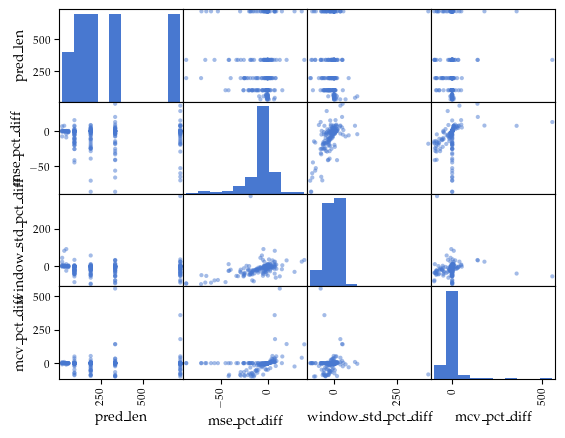

In [140]:
display(pct_diffs_all_ds[['model','pred_len','data_path','mse_pct_diff','window_std_pct_diff','mcv_pct_diff']].corr())
pd.plotting.scatter_matrix(pct_diffs_all_ds[['model','pred_len','data_path','mse_pct_diff','window_std_pct_diff','mcv_pct_diff']])

### PAPER: Histogram percentage changes

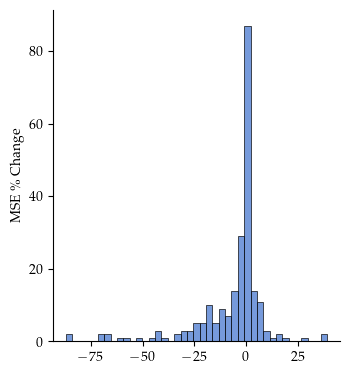

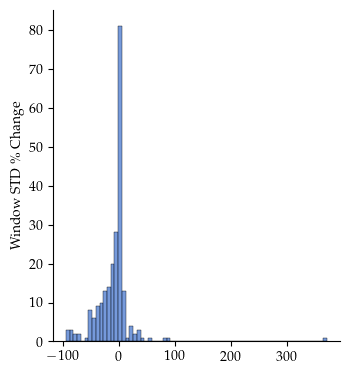

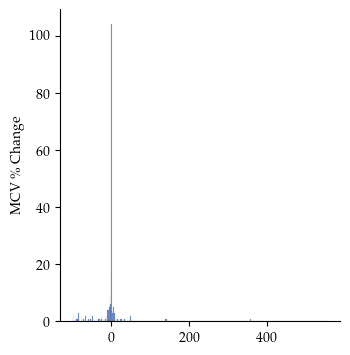

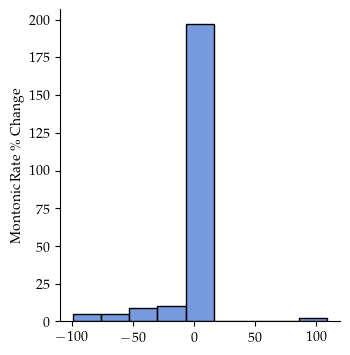

In [269]:
## pd.set_option('display.max_rows',None)

g = sns.displot(pct_diffs_all_ds.sort_values('mse_pct_diff',ascending=True).mse_pct_diff,height=4,aspect=0.9)
plt.title("")
g.set_xlabels("")
g.set_ylabels("MSE \% Change")
g.fig.supxlabel("")
g.fig.tight_layout()
plt.savefig(f"{FIGURES_FOLDER}/histogram_mse_pct_diff.pdf",bbox_inches='tight',dpi=300)
plt.show()

g = sns.displot(pct_diffs_all_ds.sort_values('window_std_pct_diff',ascending=True).window_std_pct_diff,height=4,aspect=0.9)
plt.title("")
g.set_xlabels("")
g.set_ylabels("Window STD \% Change")
g.fig.supxlabel("")
g.fig.tight_layout()
plt.savefig(f"{FIGURES_FOLDER}/histogram_window_std_pct_diff.pdf",bbox_inches='tight',dpi=300)
plt.show()

g = sns.displot(pct_diffs_all_ds.sort_values('mcv_pct_diff',ascending=True).mcv_pct_diff,height=4,aspect=0.9)
g.fig.supxlabel("")
g.fig.tight_layout()
g.set_xlabels("")
g.set_ylabels("MCV \% Change")
plt.title("")
plt.savefig(f"{FIGURES_FOLDER}/histogram_mcv_pct_diff.pdf",bbox_inches='tight',dpi=300)
plt.show()

g = sns.displot(pct_diffs_all_ds.sort_values('monotonic_rate_pct_diff',ascending=True).monotonic_rate_pct_diff,height=4,aspect=0.9)
g.fig.supxlabel("")
g.fig.tight_layout()
g.set_xlabels("")
g.set_ylabels("Montonic Rate \% Change")
plt.title("")
plt.savefig(f"{FIGURES_FOLDER}/histogram_monotonic_rate_pct_diff.pdf",bbox_inches='tight',dpi=300)
plt.show()

In [275]:
pct_diffs_all_ds.describe().reset_index()[['index','mse_pct_diff','window_std_pct_diff']]

,index,mse_pct_diff,window_std_pct_diff
0,count,228.000000,228.000000
1,mean,-6.566764,-8.874221
2,std,17.113727,35.967315
3,min,-87.052486,-94.320840
4,25%,-9.421123,-20.622880
5,50%,-0.266269,-1.835948
6,75%,0.000000,0.000000
7,max,39.179739,371.641026


### Exploring bimodal distribution of pred len MSE % changes.

,model,data_path,constant_mse,erm_mse,mse_pct_diff
4,Reformer,ETTh2.csv,0.30922,0.56242,-45.019736
1,FiLM,exchange_rate.csv,0.09426,0.16200,-41.814815


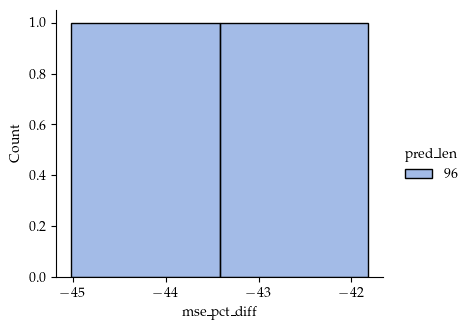

In [107]:
dd=pct_diffs_all_ds.query('pred_len in [96,192,336,720]').copy()
# Second mode of pred len 96
dd=dd.query('mse_pct_diff >  -80 and mse_pct_diff < -30 and pred_len==96')
display(dd[['model','data_path','constant_mse','erm_mse','mse_pct_diff']])
sns.displot(data=dd,x='mse_pct_diff',hue='pred_len',palette='muted',kind='hist',aspect=1.2,height=3.4)

,model,data_path,constant_mse,erm_mse,mse_pct_diff
25,Reformer,ETTh2.csv,0.71005,2.06243,-65.572165
25,Reformer,ETTm2.csv,0.54896,1.87805,-70.769681
23,Informer,exchange_rate.csv,1.16969,2.96116,-60.498926
27,Transformer,exchange_rate.csv,1.02856,2.19707,-53.184924


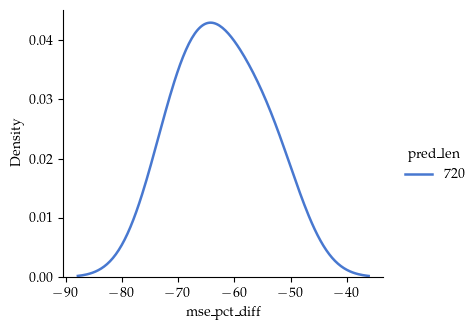

In [108]:
dd=pct_diffs_all_ds.query('pred_len in [96,192,336,720]').copy()
# Second mode of pred len 96
dd=dd.query('mse_pct_diff >  -100 and mse_pct_diff < -50 and pred_len==720')
display(dd[['model','data_path','constant_mse','erm_mse','mse_pct_diff']].head())
sns.displot(data=dd,x='mse_pct_diff',hue='pred_len',palette='muted',kind='kde',aspect=1.2,height=3.4)

### Correlation: Model

#### Correlations of model strength and % changes: Do stronger models improve with constraints?
Sort models by ERM MSE then see how MSE % DIFF and window % DIFF behave.

array([[<AxesSubplot:xlabel='erm_mse', ylabel='erm_mse'>,
        <AxesSubplot:xlabel='mse_pct_diff', ylabel='erm_mse'>,
        <AxesSubplot:xlabel='window_std_pct_diff', ylabel='erm_mse'>,
        <AxesSubplot:xlabel='mcv_pct_diff', ylabel='erm_mse'>],
       [<AxesSubplot:xlabel='erm_mse', ylabel='mse_pct_diff'>,
        <AxesSubplot:xlabel='mse_pct_diff', ylabel='mse_pct_diff'>,
        <AxesSubplot:xlabel='window_std_pct_diff', ylabel='mse_pct_diff'>,
        <AxesSubplot:xlabel='mcv_pct_diff', ylabel='mse_pct_diff'>],
       [<AxesSubplot:xlabel='erm_mse', ylabel='window_std_pct_diff'>,
        <AxesSubplot:xlabel='mse_pct_diff', ylabel='window_std_pct_diff'>,
        <AxesSubplot:xlabel='window_std_pct_diff', ylabel='window_std_pct_diff'>,
        <AxesSubplot:xlabel='mcv_pct_diff', ylabel='window_std_pct_diff'>],
       [<AxesSubplot:xlabel='erm_mse', ylabel='mcv_pct_diff'>,
        <AxesSubplot:xlabel='mse_pct_diff', ylabel='mcv_pct_diff'>,
        <AxesSubplot:xlabel='window_

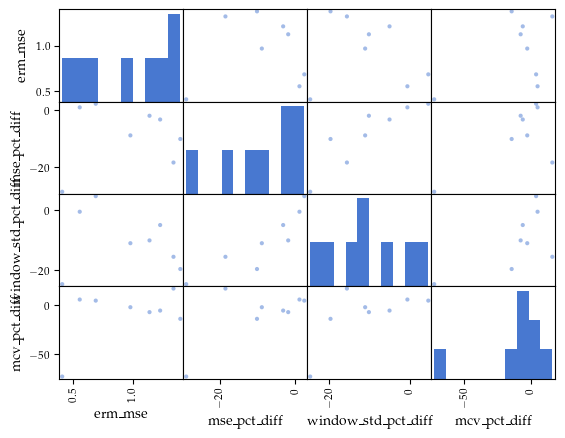

In [136]:
model_summary_pct_diff=pct_diffs_all_ds.groupby('model').mean().reset_index().sort_values('erm_mse',ascending=True)[['model','erm_mse','mse_pct_diff','window_std_pct_diff','mcv_pct_diff']]

model_summary_pct_diff
pd.plotting.scatter_matrix(model_summary_pct_diff)

<AxesSubplot:xlabel='erm_mse', ylabel='window_std_pct_diff'>

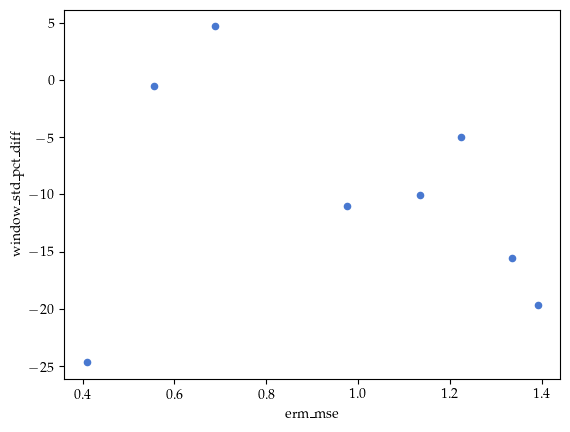

In [131]:
model_summary_pct_diff.plot.scatter(x='erm_mse',y='window_std_pct_diff')

Window variance is negatively correlated with erm mse, but mse and mcv are positively correlated.

In [123]:
pct_diffs_all_ds.groupby('model').mean().reset_index()[['erm_mse','mse_pct_diff','window_std_pct_diff','mcv_pct_diff']].corr()

,erm_mse,mse_pct_diff,window_std_pct_diff,mcv_pct_diff
erm_mse,1.000000,0.088859,-0.183542,0.483507
mse_pct_diff,0.088859,1.000000,0.884041,0.668088
window_std_pct_diff,-0.183542,0.884041,1.000000,0.635203
mcv_pct_diff,0.483507,0.668088,0.635203,1.000000


### PAPER: Boxplots pct changes per variable

In [231]:
dataset_ranks=pct_diffs_all_ds.groupby('data_path')['erm_mse'].mean().sort_values().reset_index().reset_index().rename(columns={'index':'data_path_rank'})[['data_path','data_path_rank']]
dataset_ranks

,data_path,data_path_rank
0,electricity.csv,0
1,ETTm2.csv,1
2,weather.csv,2
3,ETTh2.csv,3
4,ETTm1.csv,4
5,ETTh1.csv,5
6,exchange_rate.csv,6
7,national_illness.csv,7


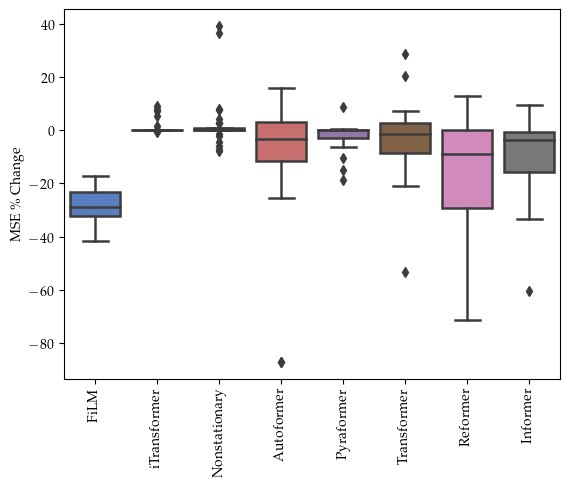

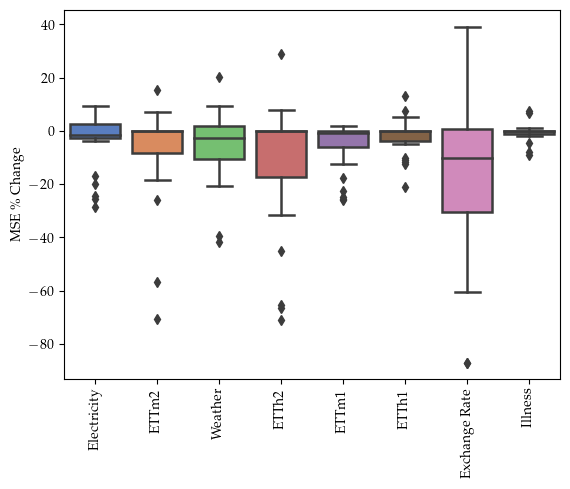

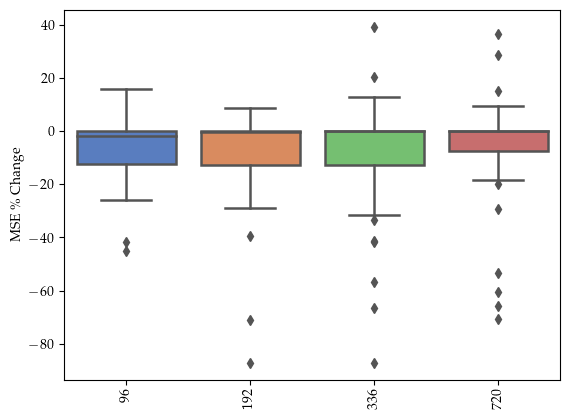

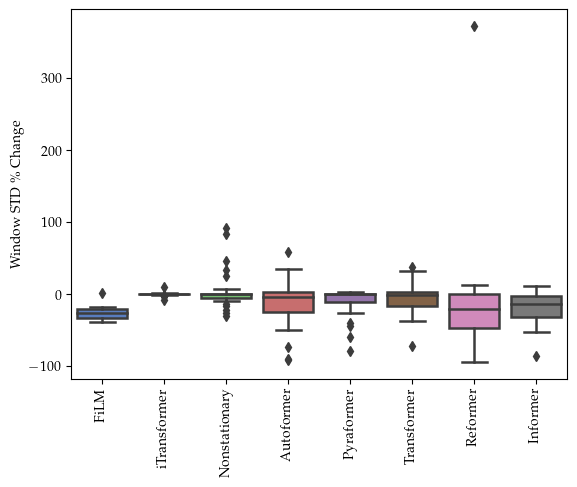

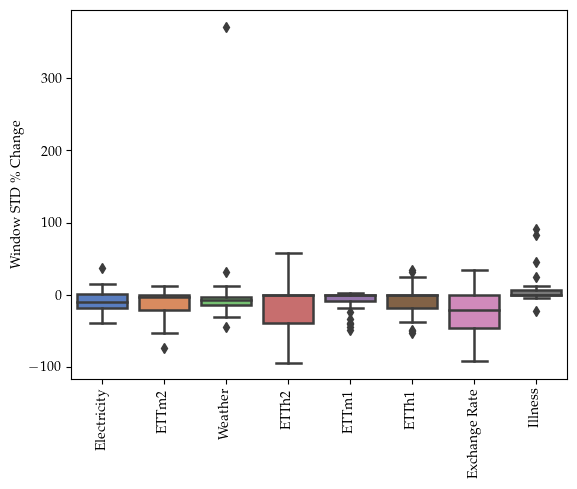

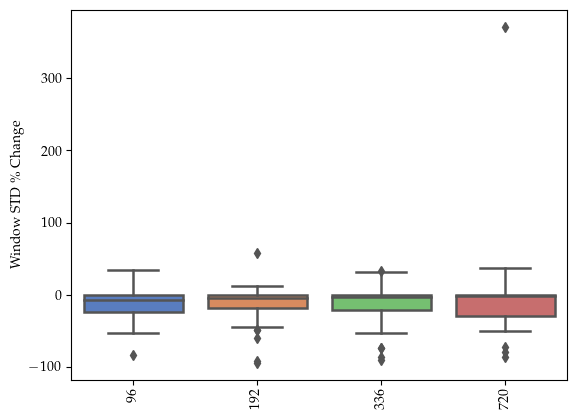

In [245]:
def dimension_preproc(data,dimension):
    """ Preprocesses the dataset depending on the dimenison and prettifies dataset names for visualization """
    if dimension=="pred_len":
            to_plot = data.query('pred_len in [96,192,336,720]').copy()
    else: 
            to_plot = data.copy()
    to_plot['data_path']=to_plot.data_path.apply(pretty_name_dataset)
    to_plot['model'] = to_plot.model.str.replace("Nonstationary_Transformer","Nonstationary")
    return to_plot

#sns.displot(data=pct_diffs_all_ds.query('pred_len in [96,192,336,720]'),x='mse_pct_diff',col='pred_len')
metrics = ['mse_pct_diff', 'window_std_pct_diff']#, 'monotonic_rate_pct_diff']
fancy_metrics = {
    'mse_pct_diff':"MSE \% Change", 
    'window_std_pct_diff': "Window STD \% Change"
}
dimensions = ['model','data_path','pred_len']
fancy_dimensions = {
    'model': 'Model',
    'data_path': 'Dataset',
    'pred_len': 'Prediction Length'
}
# model rank column for sorting (best by overall MSE)
model_ranks=pct_diffs_all_ds.groupby('model')['erm_mse'].mean().sort_values().reset_index().reset_index().rename(columns={'index':'model_rank'})[['model','model_rank']]
# hardest datasets first
dataset_ranks=pct_diffs_all_ds.groupby('data_path')['erm_mse'].mean().sort_values(ascending=True).reset_index().reset_index().rename(columns={'index':'data_path_rank'})[['data_path','data_path_rank']]

for metric in metrics: 
    for dimension in dimensions:
        to_plot = dimension_preproc(pct_diffs_all_ds,dimension)
        # display(Markdown(f"#### {fancy_metrics[metric]} per {dimension}"))
        # display(to_plot.groupby(dimension)[metric].mean().reset_index().sort_values(metric,ascending=True))
for metric in metrics: 
    for dimension in dimensions:
        # preproc
        to_plot=pct_diffs_all_ds
        to_plot=to_plot.merge(dataset_ranks,on='data_path')
        to_plot=to_plot.merge(model_ranks,on='model')
        to_plot = dimension_preproc(to_plot,dimension)
        
        #g = sns.displot(data=to_plot,x=metric,hue=dimension,palette='muted',kind='kde',aspect=1.2,height=3.4)
        # Sorting by rank if not predlen
        if dimension!="pred_len":
            to_plot = to_plot.sort_values(f'{dimension}_rank',ascending=True)
        # plotting
        g=sns.boxplot(data=to_plot,x=dimension,y=metric,palette='muted',
                      showfliers=True)#last arg removes outliers
        
        #asteriks
        g.set_xticklabels(g.get_xticklabels(), rotation=90)
        #g = sns.displot(data=pct_diffs_all_ds,x=metric,hue=dimension)
        plt.title(f"")
        g.set_xlabel("")
        g.set_ylabel(fancy_metrics[metric])
        #g.set_titles(template="{row_name} ({col_name})")
        # g.fig.supylabel("MSE")
        #g.fig.suptitle(f'{pretty_name_dataset(data_path)}')
        #display(pct_diffs_all_ds.groupby(dimension)[metric].mean().reset_index().sort_values(metric,ascending=True))
        plt.savefig(f"{FIGURES_FOLDER}/boxplot_{metric}_{dimension}.pdf")
        plt.show()

### Random Forest Feature importance Computation

In [157]:
# #TODO WIP
# #pct_diffs_all_ds.query('pred_len in [96,192,336,720]').
# correlation_with_mse = pct_diffs_all_ds.corrwith(y)  # y being the MSE column
# print(correlation_with_mse.sort_values(ascending=False))
from sklearn.ensemble import RandomForestRegressor

X = pct_diffs_all_ds.query('pred_len in [96,192,336,720]')
y = X.mse_pct_diff
from sklearn.preprocessing import OneHotEncoder
encoded = []
encoders = {}
for col in ['model','data_path','pred_len']:
    encoder = OneHotEncoder(sparse=False)
    category_encoded = encoder.fit_transform(X[col].to_numpy().reshape(-1,1))
    encoded.append(pd.DataFrame(category_encoded,columns=encoder.get_feature_names()))
    encoders[col] = encoder
X = pd.concat(encoded,axis=1)

# Assuming X is your features and y is your MSE
model = RandomForestRegressor()
model.fit(X, y)

# Get feature importances
importances = model.feature_importances_

# To see the feature importance in a more interpretable form:
feature_importance_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

print(feature_importance_df)

                         Feature  Importance
9                   x0_ETTh2.csv    0.134353
13          x0_exchange_rate.csv    0.120034
5                    x0_Reformer    0.116509
0                  x0_Autoformer    0.077464
18                        x0_720    0.072715
15                         x0_96    0.066593
1                        x0_FiLM    0.066247
16                        x0_192    0.052256
11                  x0_ETTm2.csv    0.049450
17                        x0_336    0.046441
3   x0_Nonstationary_Transformer    0.042027
2                    x0_Informer    0.037187
14                x0_weather.csv    0.033219
6                 x0_Transformer    0.021265
12            x0_electricity.csv    0.017383
10                  x0_ETTm1.csv    0.016642
8                   x0_ETTh1.csv    0.013531
4                  x0_Pyraformer    0.013529
7                x0_iTransformer    0.003156


/home/jporras/miniconda3/envs/autoformer/lib/python3.7/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
/home/jporras/miniconda3/envs/autoformer/lib/python3.7/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
/home/jporras/miniconda3/envs/autoformer/lib/python3.7/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [170]:
from sklearn.inspection import permutation_importance
r = permutation_importance(model, X, y,
                            n_repeats=30,
                            random_state=0)
permuted_importances = pd.DataFrame(list(zip(X.columns,r.importances_mean)),columns=['feature_val','importance']).sort_values('importance',ascending=False)
# for i in r.importances_mean.argsort()[::-1]:
#      if r.importances_mean[i] - 2 * r.importances_std[i] > 0:
#          print(f"{diabetes.feature_names[i]:<8}"
#                f"{r.importances_mean[i]:.3f}"
#                f" +/- {r.importances_std[i]:.3f}")

### USEFUL: RANDOM FOREST PERMUTED FEATURE IMPORTANCES

In [179]:
val_to_feat={}
for m in ['model','data_path','pred_len']:
    val_to_feat={**val_to_feat,**dict(zip(encoders[m].get_feature_names(),[m]*len(encoders[m].get_feature_names())))}
permuted_importances['feature'] = permuted_importances.feature_val.map(val_to_feat)
permuted_importances
permuted_importances.groupby('feature')['importance'].mean().sort_values(ascending=False).reset_index()

/home/jporras/miniconda3/envs/autoformer/lib/python3.7/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,feature,importance
0,model,0.177441
1,data_path,0.155257
2,pred_len,0.089166


In [186]:
# unpermuted importances just to compare. Indeed they are different. and their relationship changes.
feature_importance_df['feature_parent'] = feature_importance_df["Feature"].map(val_to_feat)
feature_importance_df.groupby('feature_parent')['Importance'].mean().sort_values(ascending=False).reset_index()

,feature_parent,Importance
0,pred_len,0.059501
1,data_path,0.054945
2,model,0.047173


In [160]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import OneHotEncoder

# Your dataset filtered by 'pred_len'
X = pct_diffs_all_ds.query('pred_len in [96, 192, 336, 720]')
y = X.mse_pct_diff

# Store encoders and the data they encode
encoders = {}
encoded_data_frames = []

# Columns to encode
columns_to_encode = ['model', 'data_path', 'pred_len']

for col in columns_to_encode:
    encoder = OneHotEncoder(sparse=False)
    category_encoded = encoder.fit_transform(X[col].to_numpy().reshape(-1, 1))
    # Create a DataFrame for the encoded data with feature names
    encoded_df = pd.DataFrame(category_encoded, columns=[f"{col}_{category}" for category in encoder.categories_[0]])
    encoded_data_frames.append(encoded_df)
    encoders[col] = encoder  # Store encoder for later use

# Concatenate all the encoded DataFrames horizontally (along columns)
X_encoded = pd.concat(encoded_data_frames, axis=1)

# Fit the RandomForest model
model = RandomForestRegressor()
model.fit(X_encoded, y)

# Retrieve feature importances
importances = model.feature_importances_

# Aggregate feature importances by original column name
importance_dict = {col: 0 for col in columns_to_encode}
for col, importance in zip(X_encoded.columns, importances):
    # Extract the original column name and sum the importances
    original_col_name = col.split('_')[0]
    importance_dict[original_col_name] += importance

# Convert aggregated importance data into a DataFrame for nicer display
aggregated_importances_df = pd.DataFrame(list(importance_dict.items()), columns=['Feature', 'Aggregated Importance']).sort_values(by='Aggregated Importance', ascending=False)

print(aggregated_importances_df)


KeyError: 'data'

### PAPER?: Heatmap dataset vs model improvement

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming pct_diffs_all_ds is your dataset, you would load it into a DataFrame. For demonstration, here's how you'd read it from a CSV file:

# Here, you would replace the next line with your actual data variable
# For example: df = pct_diffs_all_ds

# Pivot the DataFrame to format it for the heatmap

heatmap_data = pct_diffs_all_ds.groupby(["model", "data_path"]).mean().reset_index().pivot("model", "data_path", "mse_pct_diff")

# Plotting the heatmap
plt.figure(figsize=(10, 8))
from matplotlib.colors import LinearSegmentedColormap
#green_red = LinearSegmentedColormap.from_list("green_red", ["green", "red"])
#sns.heatmap(heatmap_data, annot=True, cmap=green_red, fmt=".2f",center=0)
sns.heatmap(heatmap_data, annot=True, cmap='RdBu_r', fmt=".2f",center=0,vmin=-20,vmax=20)
plt.title('Heatmap of MSE % Difference (ERM vs Constrained) by Model and Dataset')
plt.ylabel('Model')
plt.xlabel('Dataset')
plt.show()
# Write out into the figures folder
plt.savefig(f"{FIGURES_FOLDER}/heatmap_mse_pct_diff.png")

## Pivot tables (resilience) (TEMP)

In [ ]:
def style_pivot_table_best_per_params(pivoted_df):
    pivoted_df=pivoted_df.copy()
    pivoted_df.columns.names = ['metric','type','model']
    mask = pd.DataFrame(False, index=pivoted_df.index, columns=pivoted_df.columns)
    for keys,subset in  pivoted_df.groupby(level=['metric','model'],axis=1):
        mask.loc[:,subset.columns] = subset.eq(subset.min(axis=1), axis=0)
        
    ##STYLE
    # truncate to 4 decimals for display
    pivoted_df=pivoted_df.style.format("{:.4f}")
    pivoted_df=pivoted_df.apply(lambda s: ['font-weight: bold;text-decoration: underline' if v else '' for v in mask.loc[s.name]], axis=1)
    return pivoted_df

def data_path_renaming(x):
    if x=="exchange_rate.csv":
        x='Exchange'
    x=x.replace(".csv","")
    if x=="electricity":
        x="ECL"
    else: 
        x=x.replace(".csv","").replace("_"," ").title()
    return latex_scaffolding_dataset(x)
def latex_scaffolding_dataset(x):
    # Add rotatebox
    x=r'\rotatebox'+'{90}{'+x+'}'
    x=r'\multirow{4}{*}{'+x+'}'
    return x
def text_bf(x):
    return r'\textbf{'+x+'}'
def latex_style_best(pivoted_df):#TODO broken
    pivoted_df=pivoted_df.copy()
    pivoted_df.columns.names = ['metric','type','model']
    mask = pd.DataFrame(False, index=pivoted_df.index, columns=pivoted_df.columns)
    for keys,subset in  pivoted_df.groupby(level=['metric','model'],axis=1):
        mask.loc[:,subset.columns] = subset.eq(subset.min(axis=1), axis=0)
    #if mask is true, add text_bf
    pivoted_df=pivoted_df.apply(lambda s: [text_bf(v) if v else '' for v in mask.loc[s.name]], axis=1)
    return pivoted_df


pd.set_option('display.max_columns', None)
def compute_pivot_over_metric(summary_metrics,pivot_value_columns=['window_std'],split='test'):
    pivoted_tables=[]
    data_paths=summary_metrics.data_path.unique()
    for data_path in data_paths:
        tp2=summary_metrics.query(f'data_path==@data_path and split==@split').copy()

        #GROUPING TEH VALS
        grouped_values=tp2.groupby(['pred_len','model','type'])[[
            'mse',
            'mcv',
            'std_mse',
            'std_mcv',
            'mean_infeasible_rate',
            'std_infeasible_rate',
            'window_std'
            ]].mean().reset_index()
        
        # Pivot of models versus constrained and ERM, values are mse and mse_diff
        all_results = grouped_values
        
        # Pivot all results, sort ascending by pred_len, then mean_violation on constrained
        pivoted=all_results.pivot(
            index=['pred_len'],
            columns=['type','model'], 
            values=pivot_value_columns
        )
        
        pivoted=style_pivot_table_best_per_params(pivoted)
        #display(pivoted)
        pivoted_tables.append(pivoted)
    result_table = pd.concat([d.data for d in pivoted_tables],keys=data_paths,names=['data_path'])

    return result_table
display(Markdown(f"# Pivot tables for split=test"))
for metric in [
    'mse',
    'mcv',
    #'mean_infeasible_rate',
    #'window_std',
    ]:
    result_table = compute_pivot_over_metric(summary_metrics,pivot_value_columns=[metric],split='test')
    display(Markdown(f"## {metric}"))
    # add bold
    display(style_pivot_table_best_per_params(result_table))
    #latex styling
    latex_table=result_table.copy()

    latex_table.index=latex_table.index \
        .set_levels([data_path_renaming(level) for level in latex_table.index.levels[0]],level=0)

    #TODO FIX the styling function to add textbf
    #latex_table=latex_style_best(latex_table)
    # drop the metric level in the multiindex
    latex_table.columns=latex_table.columns.droplevel(0)

    # Swap the column multiindex to model on top
    latex_table=latex_table.swaplevel(0,1,axis=1)

    #latex_table=style_pivot_table_best_per_params(latex_table)
    # Show only :.4f
    latex_table=latex_table.applymap(lambda x: f"{x:.4f}")
    # Rename data_path to None
    latex_table=latex_table.rename_axis(index={'data_path':None,'pred_len':''},columns={'model':'','type':''})
    #display(latex_table.columns)
    # refactor the multiindex in columns so that repeated models merge
    #print(latex_table.to_latex(escape=False,index_names=False,multicolumn_format='c',multicolumn=True))
    print(latex_table.to_latex(escape=False,multicolumn_format='c',multicolumn=True))


### Comparing variance and CoV ERM vs constrained

In [ ]:
# Calculate mean and std for mse and constraint_violation. Rename them mean_{metric} and std_{metric
#ToDO filter one seeed and split
stepwise_metrics = df_to_plot[df_to_plot.constraint_idx.isin([0,2])].query("split=='test'").groupby([
    "run_id",
    "Algorithm", #Harmless carryover col for legacy purposes (verified the counts are the same)
    "model",'type',
    "constraint_level",
    "constraint_idx",
    "pred_len",
    "data_path",
    "split",
    'step'#STEPWISE
    ])['mse','constraint_violation','infeasible_rate','run_id'].aggregate(
        mse=('mse','mean'),
        #std_mse=('mse','std'),
        mcv=('constraint_violation','mean'),
        #std_mcv=('constraint_violation','std'),
        mean_infeasible_rate=('infeasible_rate','mean'),
        #std_infeasible_rate=('infeasible_rate','std'),
        run_count=('run_id','nunique')
        ).reset_index().round(5)
summary_stepwise=stepwise_metrics.groupby([
    "run_id",
    "Algorithm", #Harmless carryover col for legacy purposes (verified the counts are the same)
    "model",
    'type',
    "constraint_level",
    "constraint_idx",
    "pred_len",
    "data_path",
    "split"]).aggregate(
        mse=('mse','mean'),
        std_mse=('mse','std'),
        mcv=('mcv','mean'),
        std_mcv=('mcv','std'),
        mean_infeasible_rate=('mean_infeasible_rate','mean'),
        std_infeasible_rate=('mean_infeasible_rate','std'),
        run_count=('run_count','mean'),
        step_count=('step','count')
    ).reset_index()
summary_stepwise

In [ ]:
summary_stepwise.groupby(['run_id','type','constraint_idx',"Algorithm","model"]).size().reset_index()

In [ ]:
dd_weather = summary_stepwise.query('data_path=="weather.csv" and pred_len==96').copy()
dd_weather.groupby(['run_id','constraint_idx',"Algorithm","model","constraint_idx"])
#dd_weather.pivot(index=['run_id','constraint_idx',"Algorithm","model","constraint_idx"], columns='type', values='mse')

#### Pivot tables stepwise

In [ ]:
#Note, variance is nan because there is only one run per parameter set
weather = summary_stepwise.query('data_path=="weather.csv"').copy()
electricity = summary_stepwise.query('data_path=="electricity.csv"').copy()
for name,dataset in [('weather',weather), ('electricity',electricity)]:
    display(Markdown(f"# {name}"))
    tp2=dataset.copy(deep=True)
    #tp2=weather.query('split=="test"').copy()
    # Compute 'infeasible amount' as the difference between the mse and the constraint_level, 0 if mse < constraint
    
    # Split into constrained and ERM
    tp2_constrained=tp2.query('type=="Constrained"').copy()
    tp2_erm_baseline=tp2.query('type=="ERM"').copy()

    distinct_constraints = tp2_constrained[['pred_len','model','constraint_level']].drop_duplicates()

    #GROUPING TEH VALS
    grouped_values=tp2.groupby(['pred_len','constraint_level','constraint_idx','model','type'])[[
        'mse','mcv',
        'std_mse','std_mcv',
        'mean_infeasible_rate','std_infeasible_rate']].mean().reset_index()

    # Pivot of models versus constrained and ERM, values are mse and mse_diff
    all_results = grouped_values#pd.concat([grouped_constrained,grouped_erm_baseline_broadcasted],axis=0)
    # Pivot all results, sort ascending by pred_len, then mean_violation on constrained

    pivoted=all_results.pivot(
        #index=['pred_len','constraint_idx'], 
        index=['pred_len'], 
        columns=['type','model'],
        values=['mse','std_mse','mcv','std_mcv','mean_infeasible_rate','std_infeasible_rate']
    ).query('constraint_level>0').round(4)
    simplified = all_results.pivot(
        index=['pred_len','constraint_level'],
        columns=['type','model'],
        values=['mse','mcv']
    )
    pd.set_option('display.max_columns', None)
    print("SIMPLIFIED 192 MSE")
    # show all pred lengths (index)
    for pred_len in [96, 192, 336, 720]:    
        print(simplified.index.get_level_values(0).unique())
        simp_mse_192=simplified[simplified.index.get_level_values(0)==pred_len][['mse']]
        sim_mcv_192=simplified[simplified.index.get_level_values(0)==pred_len][['mcv']]

        # Flatten the multiindex
        def prettify(d):
            d = d.copy()
            d.columns = d.columns.map('_'.join)
            return d.style.format(precision=3)
        # display(prettify(simp_mse_192))
        print(f"SIMPLIFIED {pred_len} MCV")
        display(prettify(sim_mcv_192))
    print("FULL")
    display(pivoted)
    #reformer works best on weather.

## Pivots per dataset

# DEBUGGING WTF

In [ ]:
# filter df_to_plot and summary_metrics to only include autoformer exchange 96 test
summary_debug = summary_metrics.query('model=="Autoformer" and data_path=="exchange_rate.csv" and pred_len==720 and split=="test"').copy()
df_debug = df_to_plot.query('model=="Autoformer" and data_path=="exchange_rate.csv" and pred_len==720 and split=="test"').copy()

display(summary_debug)
display(df_debug.shape)
sns.scatterplot(df_debug,x='step',y='mse',hue='constraint_type')

In [ ]:
df_debug.groupby(['split'])['mse'].mean()